In [ ]:
install.packages("igraph")
install.packages("latex2exp")
library(igraph)
library(knitr)
library(ggplot2)
opts_chunk$set(message=F,warning=F)
options(width=100)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



## 1. Create random networks using Erd¨os-R´enyi (ER) model
### (a)

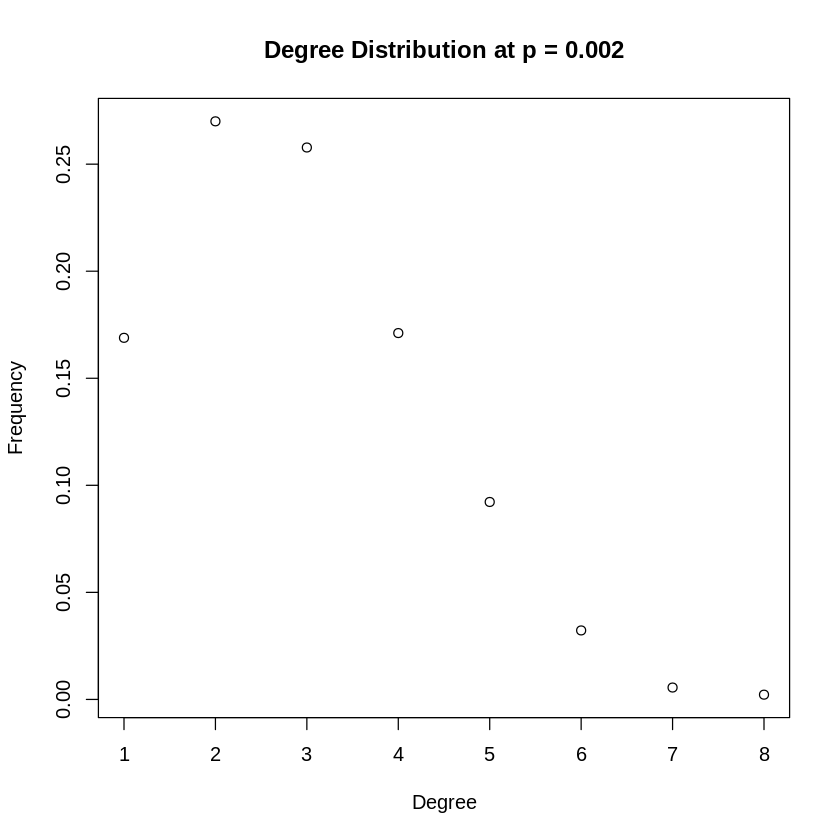

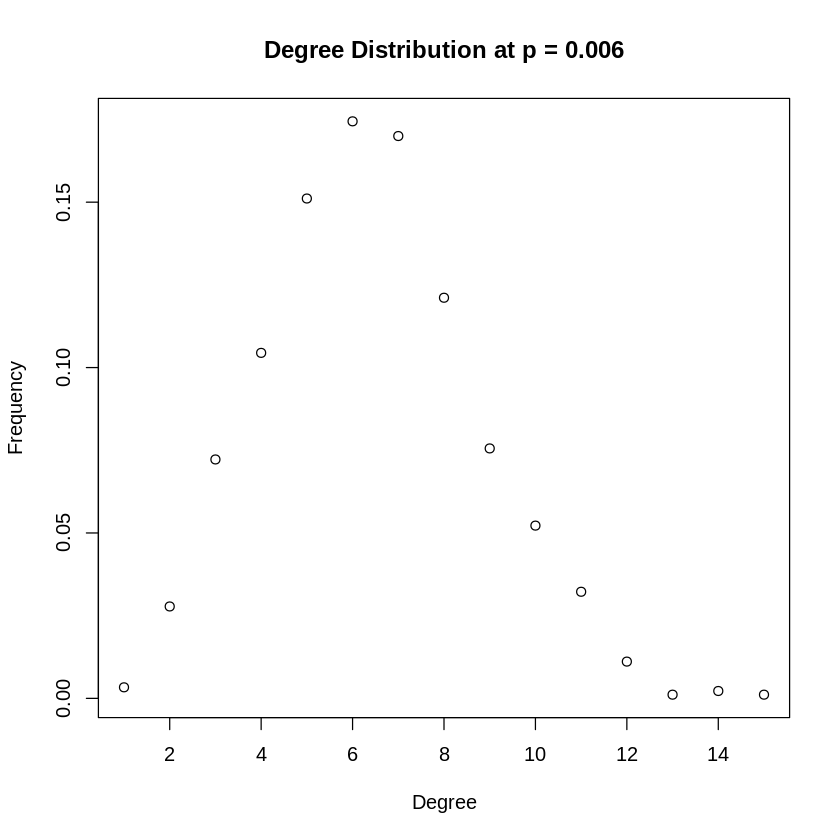

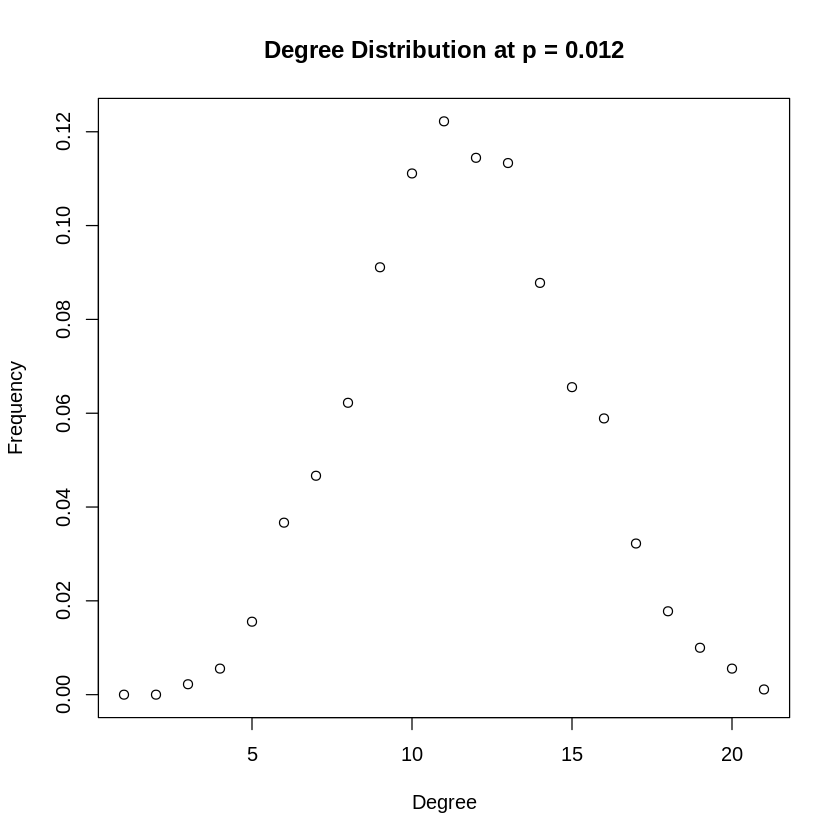

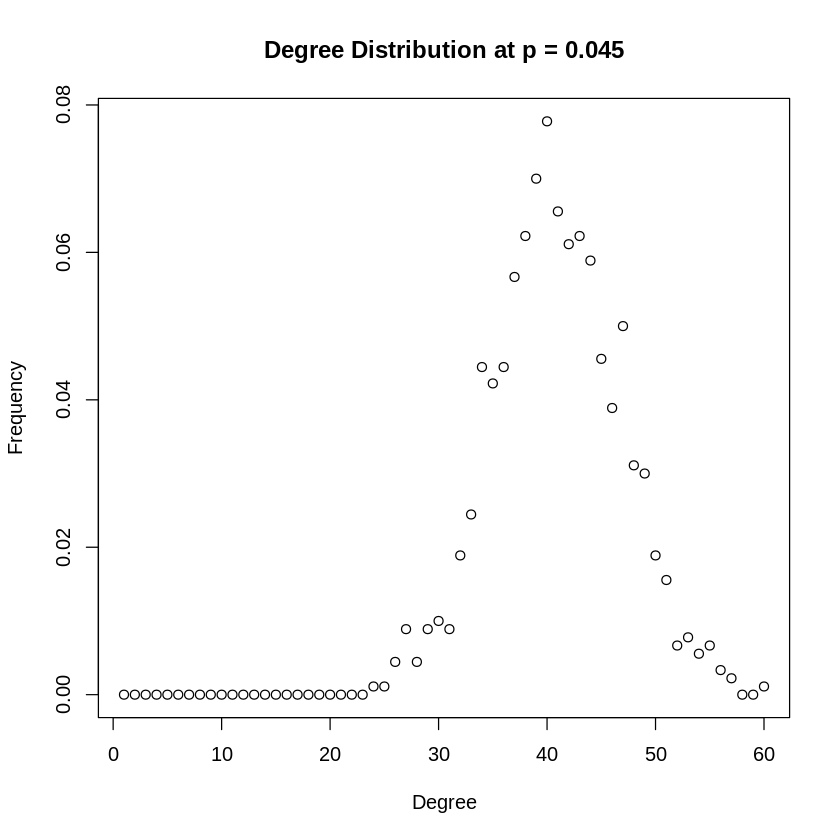

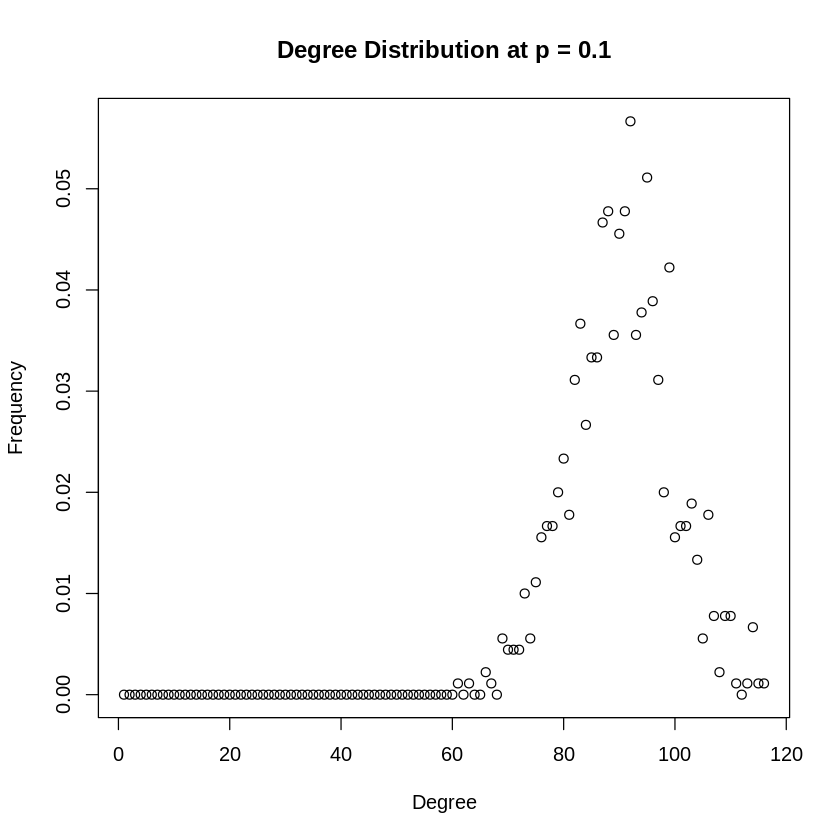

In [ ]:
n<-900
g1<-sample_gnp(n=n, p=0.002, directed = FALSE)
plot(degree_distribution(g1), main="Degree Distribution at p = 0.002", xlab="Degree", ylab="Frequency")
g2<-sample_gnp(n=n, p=0.006, directed = FALSE)
plot(degree_distribution(g2), main="Degree Distribution at p = 0.006", xlab="Degree", ylab="Frequency")
g3<-sample_gnp(n=n, p=0.012, directed = FALSE)
plot(degree_distribution(g3), main="Degree Distribution at p = 0.012", xlab="Degree", ylab="Frequency")
g4<-sample_gnp(n=n, p=0.045, directed = FALSE)
plot(degree_distribution(g4), main="Degree Distribution at p = 0.045", xlab="Degree", ylab="Frequency")
g5<-sample_gnp(n=n, p=0.1, directed = FALSE)
plot(degree_distribution(g5), main="Degree Distribution at p = 0.1", xlab="Degree", ylab="Frequency")

The probability that node $v$ has degree = $k$ is:

$$\pi_k(v) ={n-1 \choose k} p^{k}(1-p)^{n-1-k}$$

In [ ]:
n<-900
probs<-c(0.002, 0.006, 0.012, 0.045, 0.1)

erMods<-lapply(setNames(,probs),function(prob)
{
  sample_gnp(n=n, p=prob, directed = FALSE)
})

###Plot the degree distributions

distris<-lapply(erMods,function(g)
{
   deg<-degree_distribution(g)
   data.frame('degree'=0:(length(deg)-1),'Freq'=deg)
}
)

statDegs<-lapply(erMods,function(x)
{
   deg<-degree(x,mode='total')
   data.frame('MeanDegree'=mean(deg),VarDegree=var(deg))
})

data.frame(probability=probs,do.call('rbind',statDegs))

##compare them to the theoretical values

data.frame(probability=probs,
           do.call('rbind',statDegs),
           Expected=(n-1)*probs,
           Variance=probs*(1-probs)*(n-1))

,probability,MeanDegree,VarDegree
,<dbl>,<dbl>,<dbl>
0.002,0.002,1.840000,1.796396
0.006,0.006,5.411111,5.216784
0.012,0.012,11.033333,11.084538
0.045,0.045,40.420000,38.237197
0.1,0.100,89.713333,80.740868


,probability,MeanDegree,VarDegree,Expected,Variance
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.002,0.002,1.840000,1.796396,1.798,1.794404
0.006,0.006,5.411111,5.216784,5.394,5.361636
0.012,0.012,11.033333,11.084538,10.788,10.658544
0.045,0.045,40.420000,38.237197,40.455,38.634525
0.1,0.100,89.713333,80.740868,89.900,80.910000


### (b)

In [ ]:
##Are all random realizations of the ER network connected?
(connected<-sapply(erMods,function(x) is_connected(x)))

0.002 0.006 0.012 0.045   0.1 
FALSE FALSE  TRUE  TRUE  TRUE

In [ ]:
##Numerically estimate the probability that a generated network is connected
n<-900

sims<-1000
sapply(probs,function(prob)
{
conntected<-sapply(1:sims,function(x)  is_connected(sample_gnp(n=n, p=prob, directed = FALSE)))
sum(conntected)/sims
})

[1] 0.000 0.024 0.989 1.000 1.000

In [ ]:
##For one instance of the networks with that p, find the giant connected component (GCC) if not connected
sapply(erMods[!connected],function(x)
{
  max(components(x)$csize)
})

0.002 0.006 
  646   896

In [ ]:
##What is the diameter of the GCC?
sapply(erMods[!connected],function(x)
{
    clus<-decompose(x)
    largest<-clus[[which.max(sapply(clus,gorder))]]
    diameter(largest)
})

0.002 0.006 
   22     8

### (c)

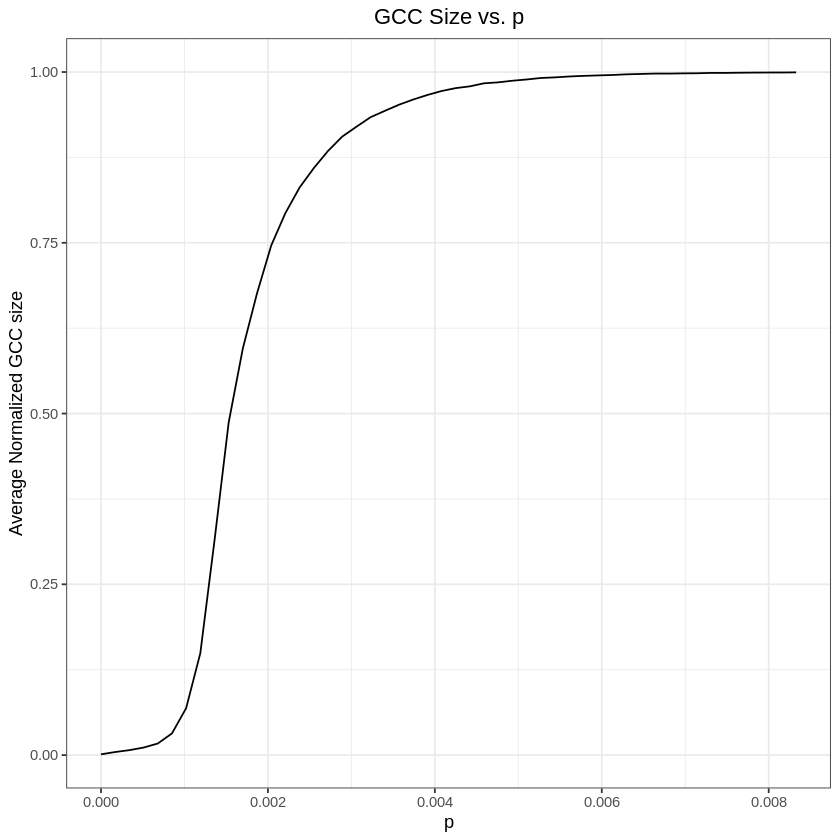

In [ ]:
library(latex2exp)

n<-900
pmax<-log(2*n)/(n)
pmin<-0
ps<-seq(pmin,pmax,length.out=50)

simulation.gcc.normalzied<-sapply(ps,function(prob)
                        {
                        gcc.norm<-sapply(1:100,function(ii)
                        {
                        erg<-sample_gnp(n=n, p=prob, directed = FALSE)
                        largest<-max(components(erg)$csize)
                        largest/gorder(erg)
                        })
                        mean(gcc.norm)
                        }
                        )

data.frame(p=ps,gcc.normalzied=simulation.gcc.normalzied) |>
    ggplot(aes(x=p,y=gcc.normalzied))+
    geom_line()+
    theme_bw()+
    ggtitle('GCC Size vs. p')+
    theme(plot.title = element_text(hjust = 0.5))+
    labs(y='Average Normalized GCC size')

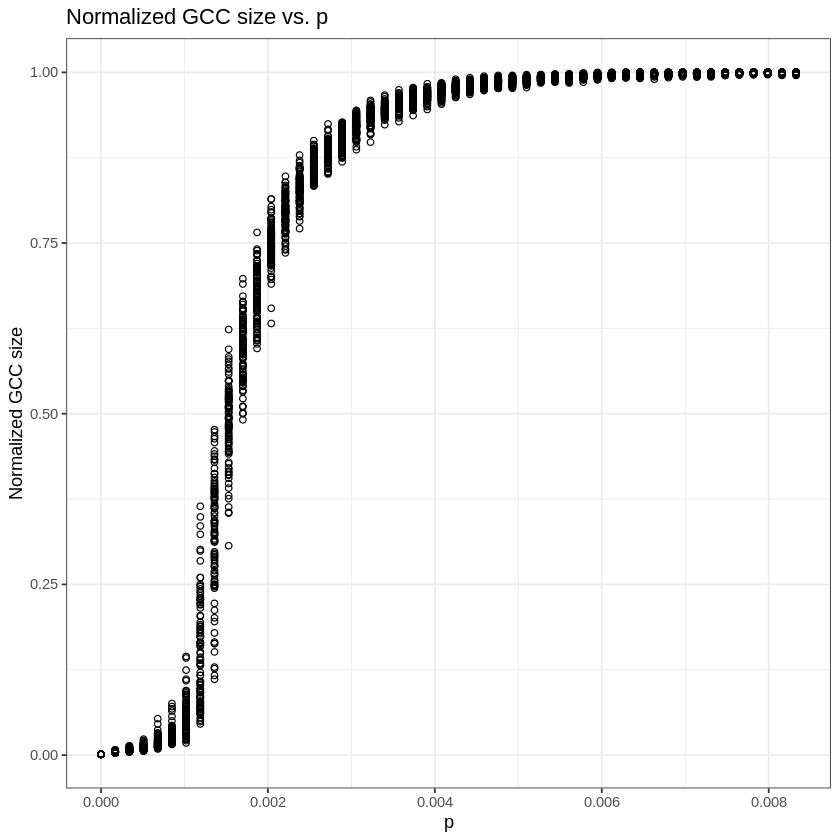

In [ ]:
n<-900
#pmax<-log(n)/(n-1)
pmax<-log(2*n)/(n)
pmin<-0
ps<-seq(pmin,pmax,length.out=50)

simulation.gcc.normalzied<-lapply(ps,function(prob)
                        {
                        gcc.norm<-sapply(1:100,function(ii)
                        {
                        erg<-sample_gnp(n=n, p=prob, directed = FALSE)
                        largest<-max(components(erg)$csize)
                        largest/gorder(erg)
                        })
                        gcc.norm
                        }
                        )

data.frame(p=rep(ps,sapply(simulation.gcc.normalzied,length)),
           gcc.normalzied=unlist(simulation.gcc.normalzied)) |>
    ggplot(aes(x=p,y=gcc.normalzied))+
    geom_point(shape=1)+
    theme_bw()+
    labs(y='Normalized GCC size',title='Normalized GCC size vs. p')

### (d)

In [ ]:
simN<-function(c)
{
     ns<-seq(100,10000,by=100)
	 
     sims<-sapply(ns,function(nn)
     {
     prob<-c/nn
	 repeats<-sapply(1:100,function(rr)
	 {
     erg<-sample_gnp(n=nn, p=prob, directed = FALSE)
     max(components(erg)$csize)
	 })
	 mean(repeats)
     })
     
     plot<-data.frame(n=ns,GCCsize=sims,c=c) |>
       ggplot(aes(x=n,y=GCCsize))+
       geom_point()+
       ggtitle('GCC Size vs. c')+
       theme(plot.title = element_text(hjust = 0.5))+
       theme_bw()
	   
	 df<-data.frame(n=ns,GCCsize=sims,c=c)
	 
	 list(df=df,plot=plot)
}

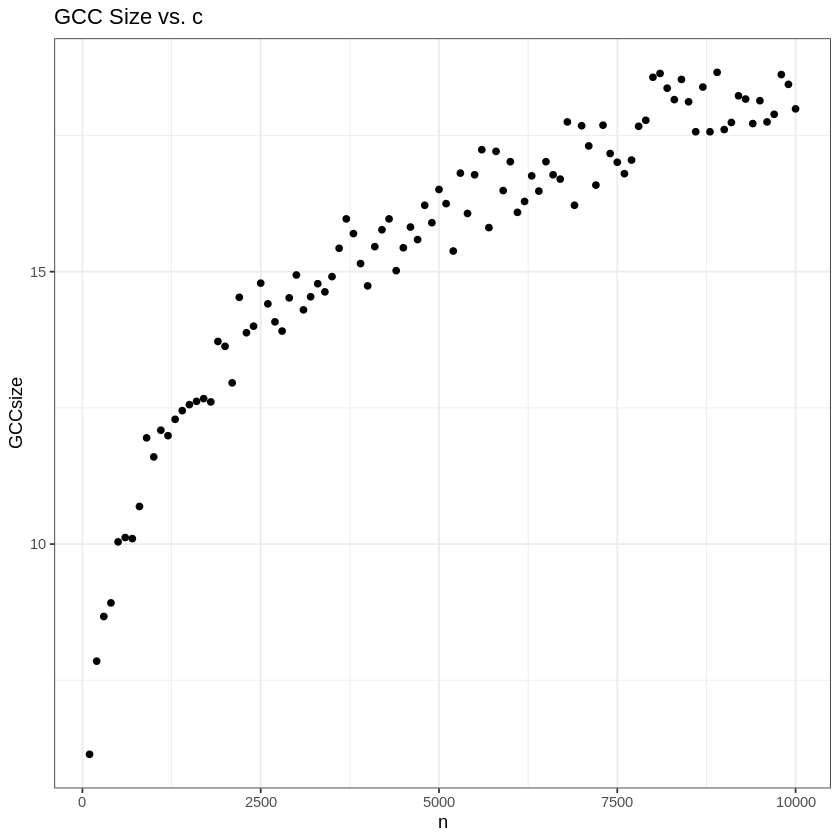

In [ ]:
simN(0.5)$plot

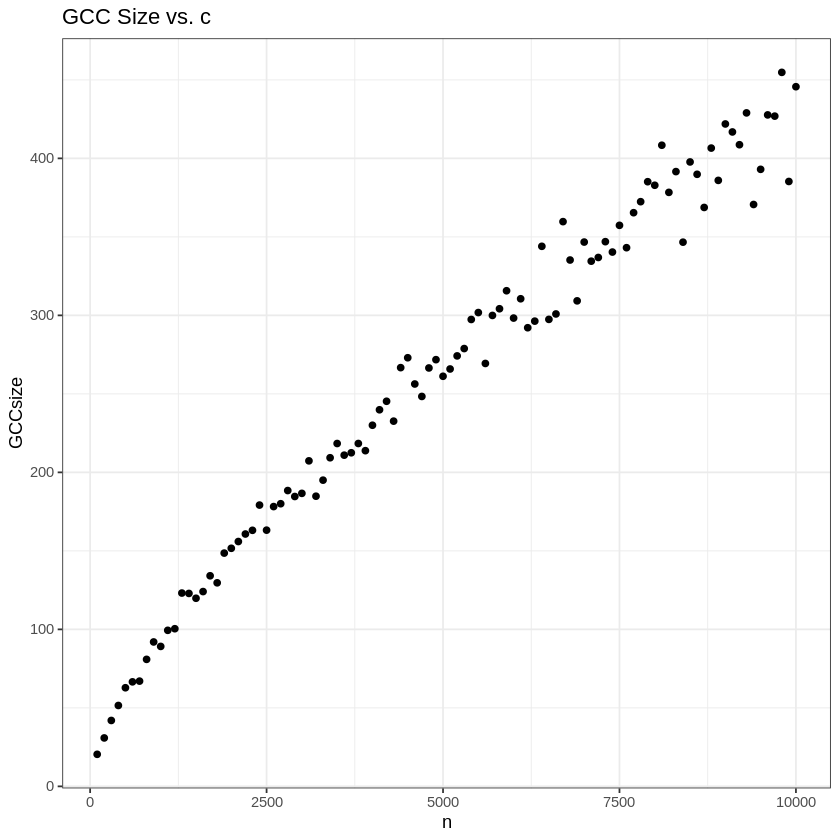

In [ ]:
simN(1)$plot

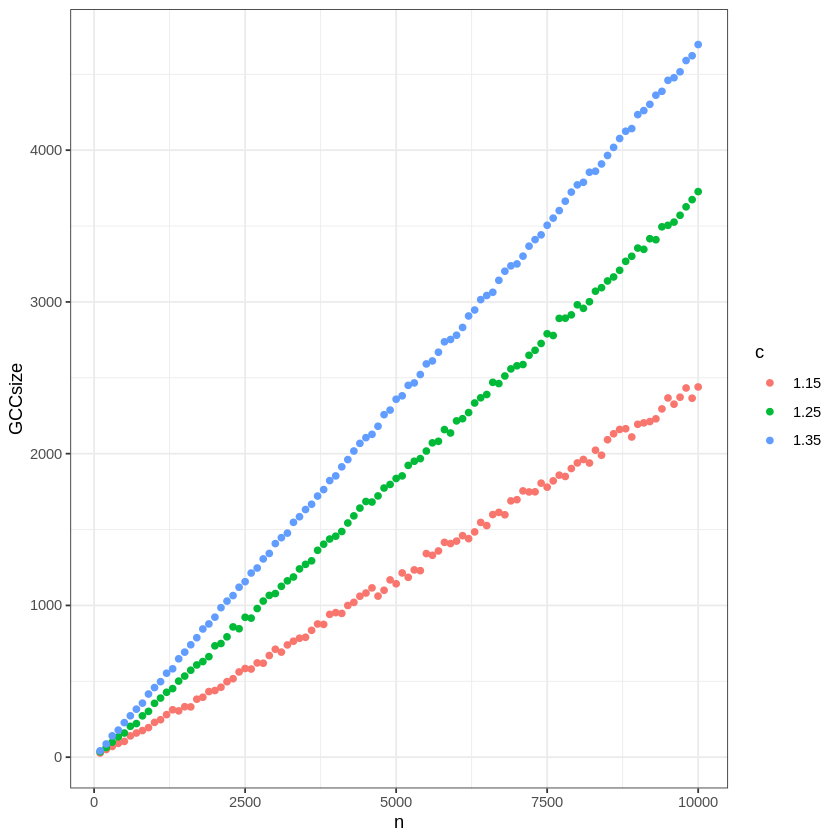

In [ ]:
do.call('rbind',lapply(c(1.15,1.25,1.35),function(x) simN(x)$df)) |>
ggplot(aes(x=n,y=GCCsize,colour=as.character(c)))+
       geom_point()+
       theme_bw()+
	   labs(colour='c')

## 2
### (a)

[1] TRUE

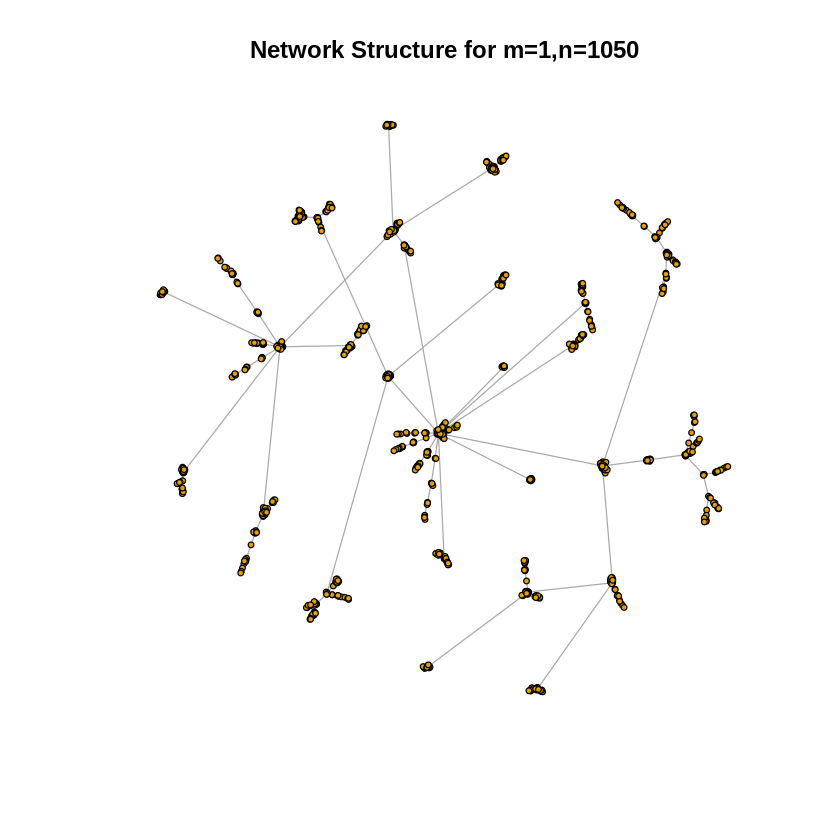

In [ ]:
##Create PA model
m<-1
paMod<-sample_pa(n=1050,m=m,directed=FALSE)
plot(paMod,vertex.label='',vertex.size=2,main="Network Structure for m=1,n=1050")

##Is such a network always connected?
is_connected(paMod)

### (b)

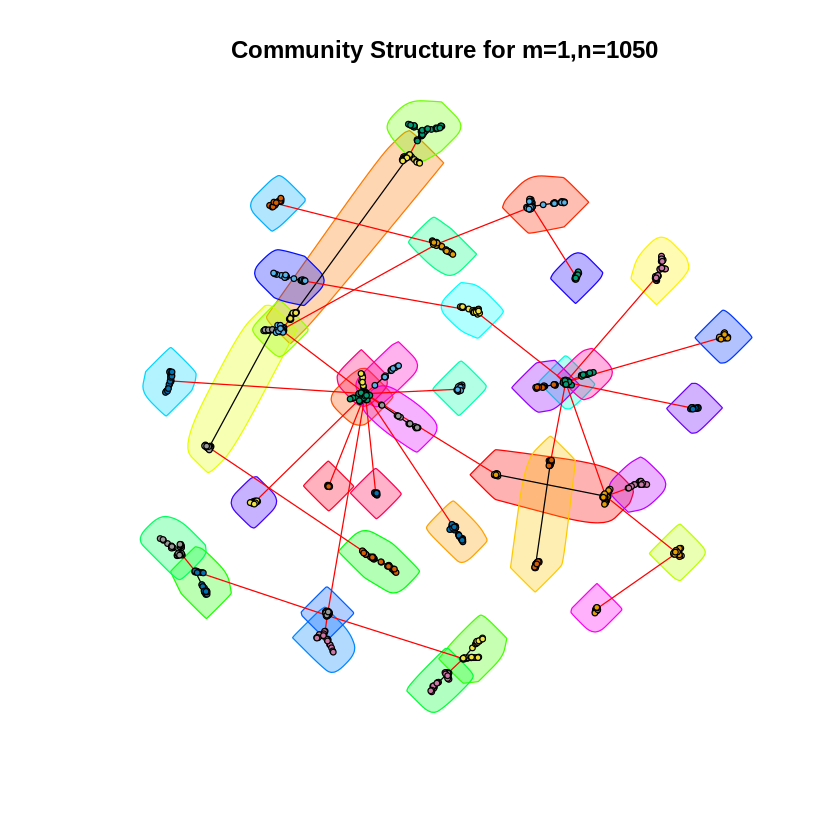

In [ ]:
##Use fast greedy method to find the community structure.
fg<-cluster_fast_greedy(paMod)
plot(fg,y=paMod,vertex.label='',vertex.size=2,main="Community Structure for m=1,n=1050")

In [ ]:
##Measure modularity
modularity(fg)

[1] 0.9327295

In [ ]:
## DefineAssortativity. Compute Assortativity.
assortativity_degree(paMod)

[1] -0.07324043

### (c)

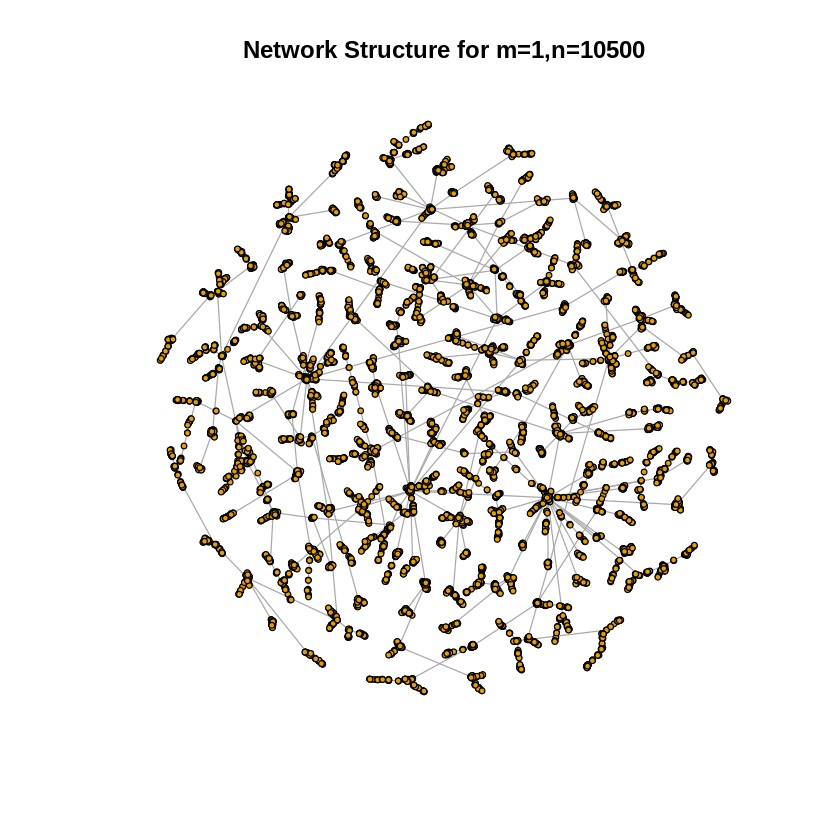

In [ ]:
paMod.large<-sample_pa(n=10500,m=m,directed=FALSE)
plot(paMod.large,vertex.label='',vertex.size=2,main="Network Structure for m=1,n=10500")

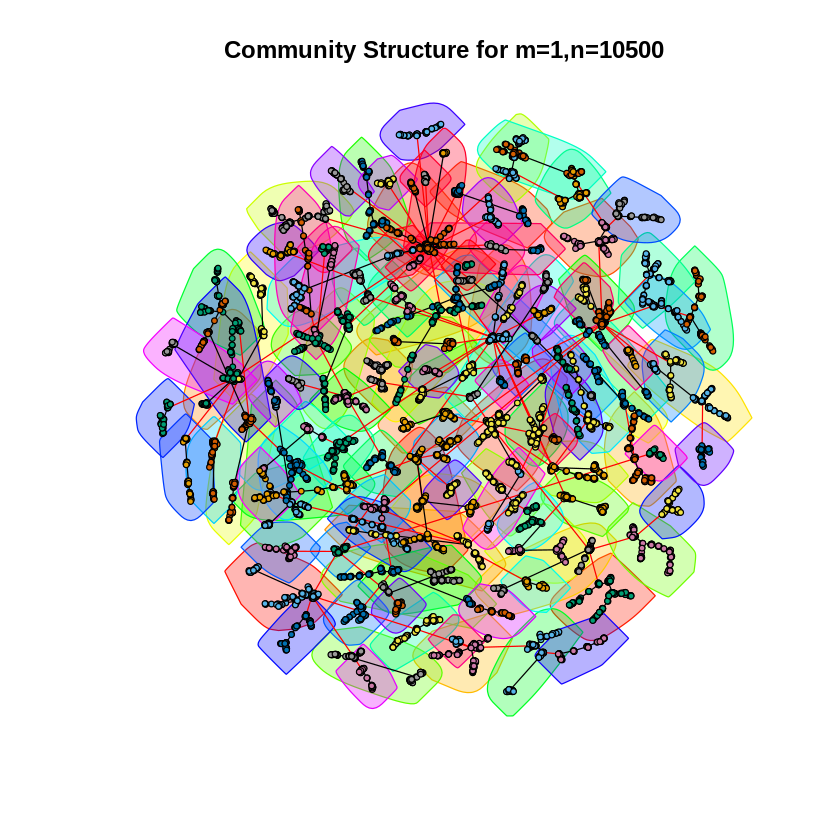

In [ ]:
fg.large<-cluster_fast_greedy(paMod.large)
plot(fg.large,y=paMod.large,vertex.label='',vertex.size=2,main="Community Structure for m=1,n=10500")

In [ ]:
modularity(fg.large)

[1] 0.9788182

In [ ]:
assortativity_degree(paMod.large)

[1] -0.02680751

### (d)

`geom_smooth()` using formula = 'y ~ x'


logK 
-2.438528

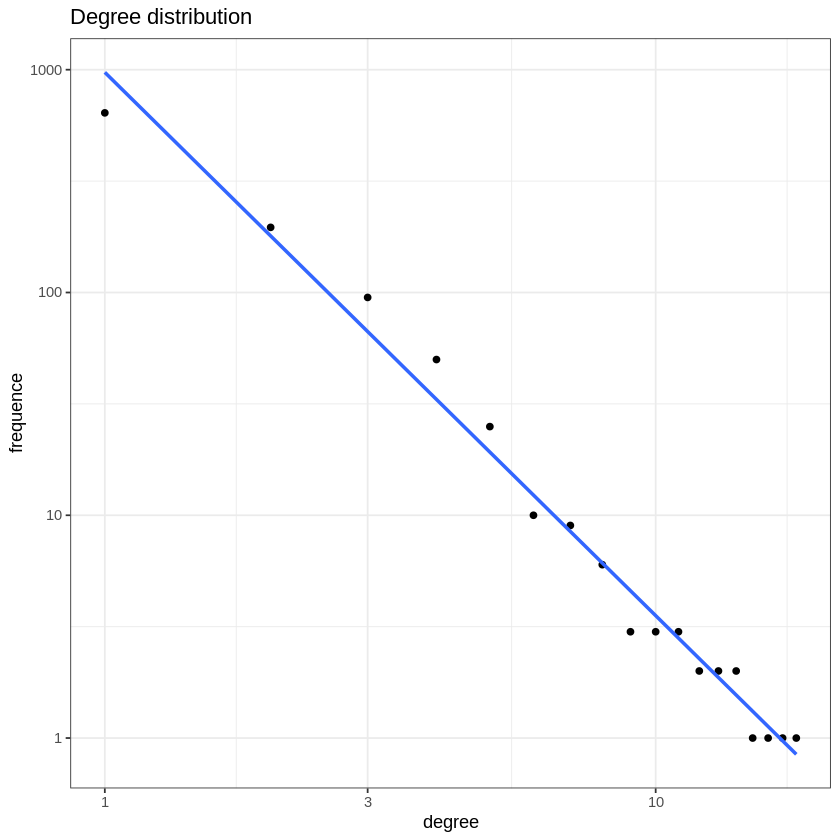

In [ ]:
###Plot the degree distribution in a log-log scale for n = 1050
plotLogLogDeg<-function(degV)
{
     deg_dist <- as.data.frame(sort(table(degV),decreasing=T))
     names(deg_dist)<-c('k','N')
     deg_dist$k<-as.numeric(deg_dist$k)
     p<-ggplot(deg_dist, aes(k , N)) +
       geom_point() +
       theme_bw() +
       scale_x_log10() +
       scale_y_log10() +
       geom_smooth(method='lm',se=FALSE)+
       labs(title = "Degree distribution", x = "degree", y = "frequence")
       
     deg_dist$logK<-log(deg_dist$k)
     deg_dist$logN<-log(deg_dist$N)
     
     beta<-coef(lm(logN~logK,data=deg_dist))[2]
     list(plot=p,slope=beta)
}


plogdeg.pamod<-plotLogLogDeg(degree(paMod))
plogdeg.pamod$plot
plogdeg.pamod$slope

`geom_smooth()` using formula = 'y ~ x'


logK 
-2.86218

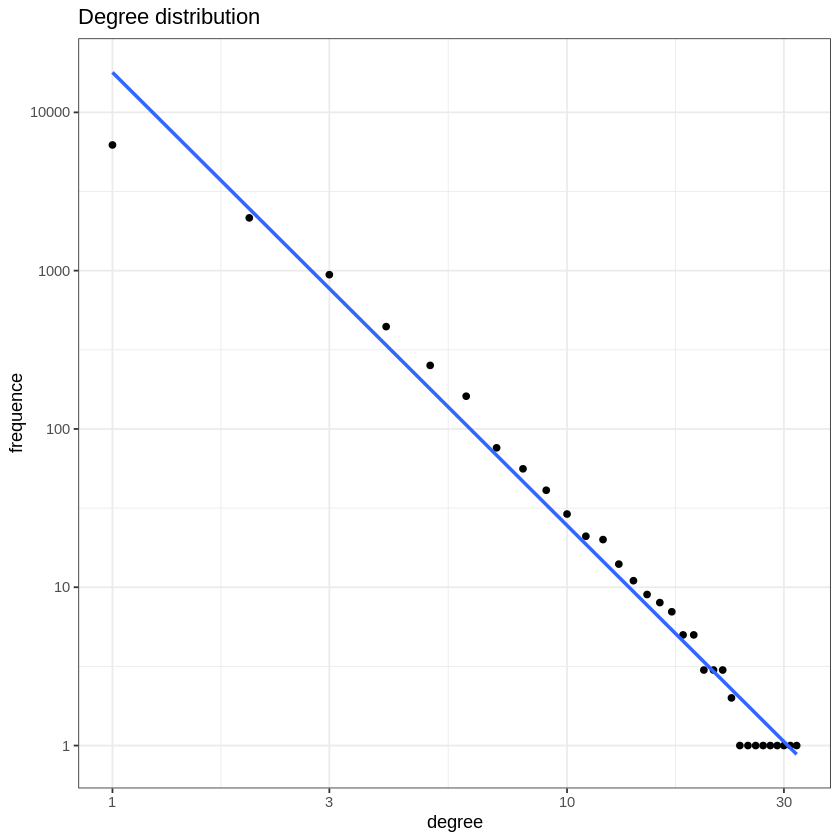

In [ ]:
###Plot the degree distribution in a log-log scale for both n = 105000
plogdeg.pamod.large<-plotLogLogDeg(degree(paMod.large))
plogdeg.pamod.large$plot
plogdeg.pamod.large$slope

### (e)

In [ ]:
##n=1050
si<-sample(1:gorder(paMod))
sj<-sapply(si,function(i) sample(neighbors(paMod,i),1))
sj.degree<-degree(paMod,sj)

`geom_smooth()` using formula = 'y ~ x'


logK 
-1.32255

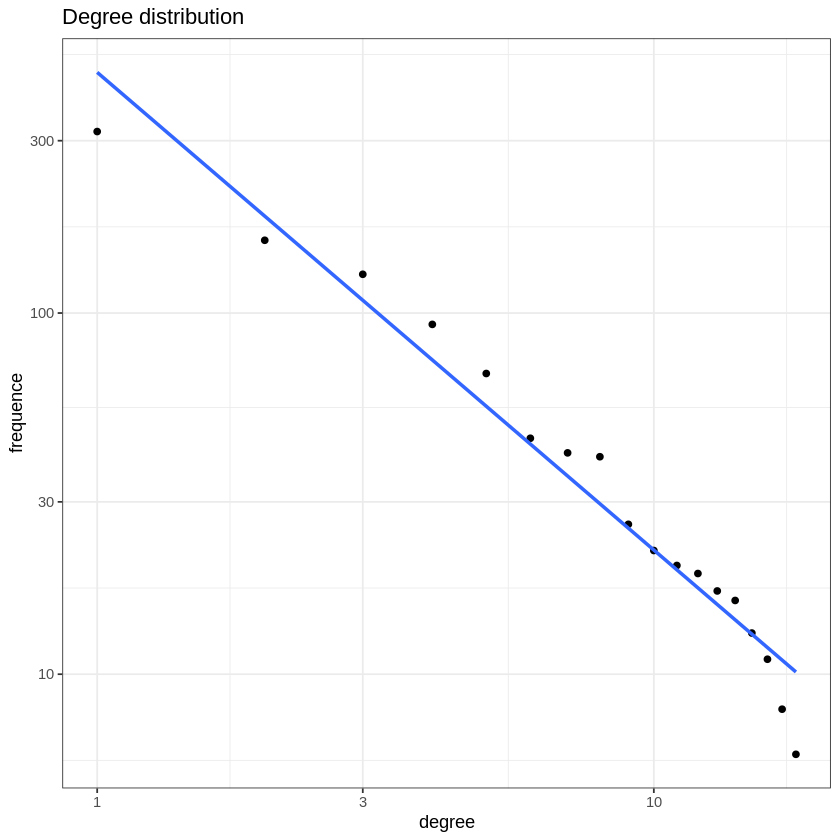

In [ ]:
##Is the distribution linear in the log-log scale?
plotLogLogDeg(sj.degree)$plot
##what is the slope?
plotLogLogDeg(sj.degree)$slope

In [ ]:
##n=10500
si<-sample(1:gorder(paMod.large))
sj<-sapply(si,function(i) sample(neighbors(paMod.large,i),1))
sj.degree<-degree(paMod.large,sj)

`geom_smooth()` using formula = 'y ~ x'


logK 
-1.672572

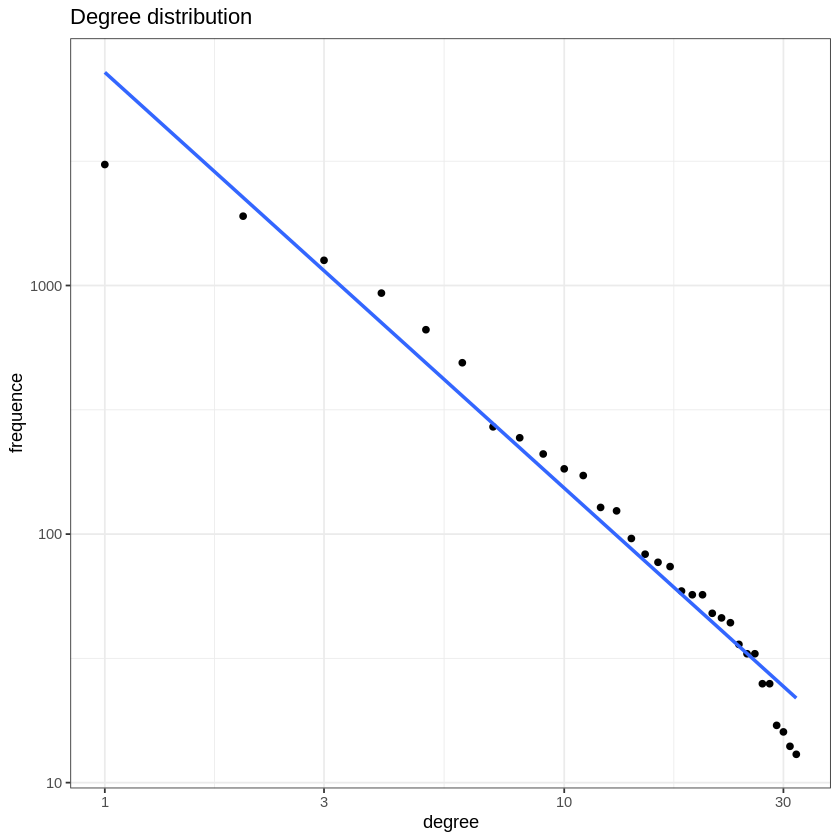

In [ ]:
##Is the distribution linear in the log-log scale?
plotLogLogDeg(sj.degree)$plot
##what is the slope?
plotLogLogDeg(sj.degree)$slope

### (f)

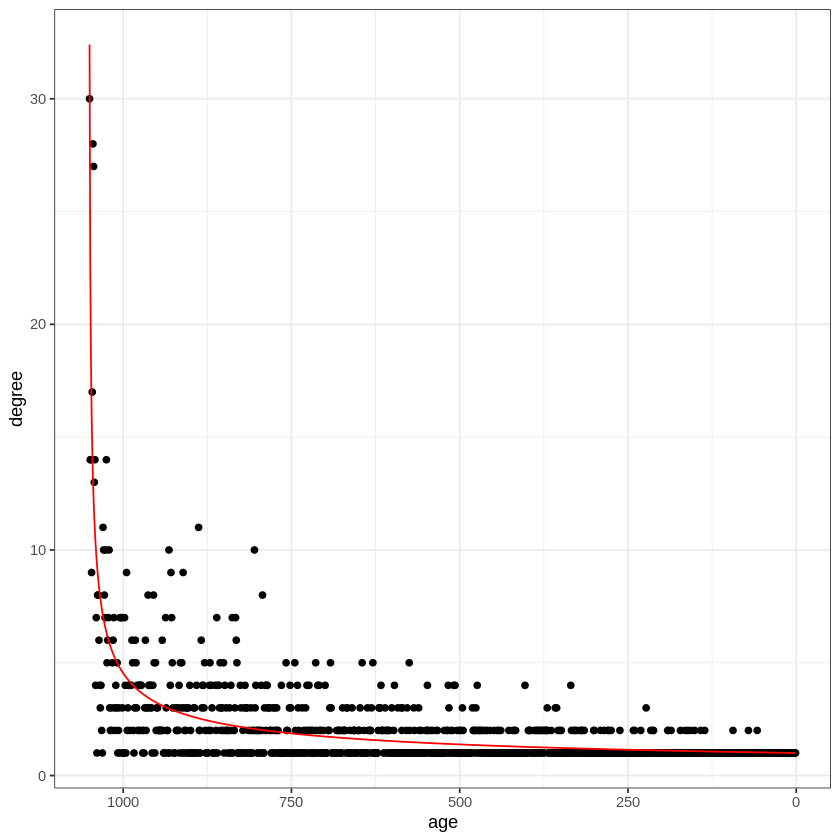

In [ ]:
m=1
t<-1050
i<-1:1050
degg<-m*sqrt(t/i)

data.frame(age=gorder(paMod):1,degree=degree(paMod)) |>
   ggplot(aes(x=age,y=degree))+
   geom_point()+
   theme_bw()+
   scale_x_reverse()+
   geom_line(data=data.frame(age=gorder(paMod):1,degree=degg),group='a',colour='red')  ##theoretical values.

### (g)

[1] TRUE

[1] 0.5225247

[1] -0.04379573

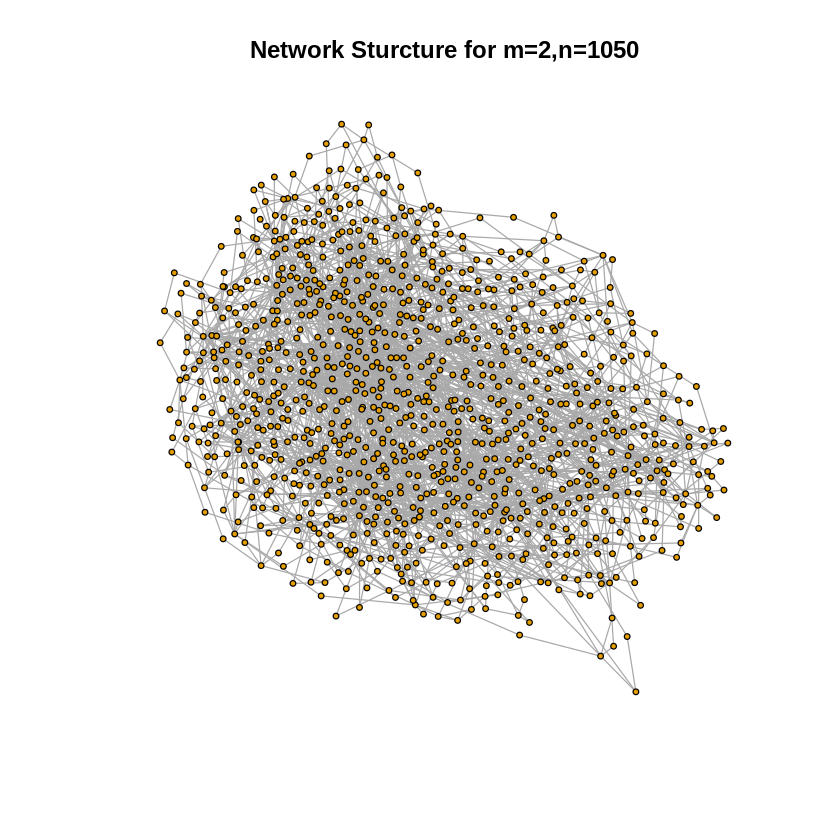

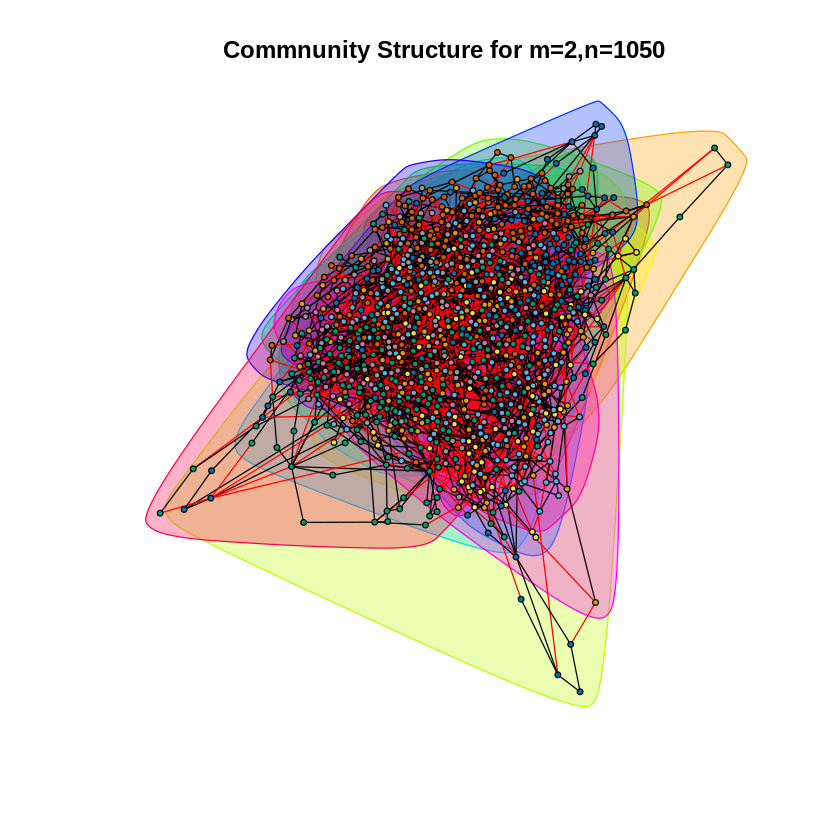

In [ ]:
m<-2
paMod<-sample_pa(n=1050,m=m,directed=FALSE)
is_connected(paMod)
fg<-cluster_fast_greedy(paMod)
modularity(fg)
assortativity_degree(paMod)
plot(paMod,vertex.label='',vertex.size=2,main="Network Sturcture for m=2,n=1050")
plot(fg,y=paMod,vertex.label='',vertex.size=2,main="Commnunity Structure for m=2,n=1050")



[1] TRUE

[1] 0.5312216

[1] -0.01076866

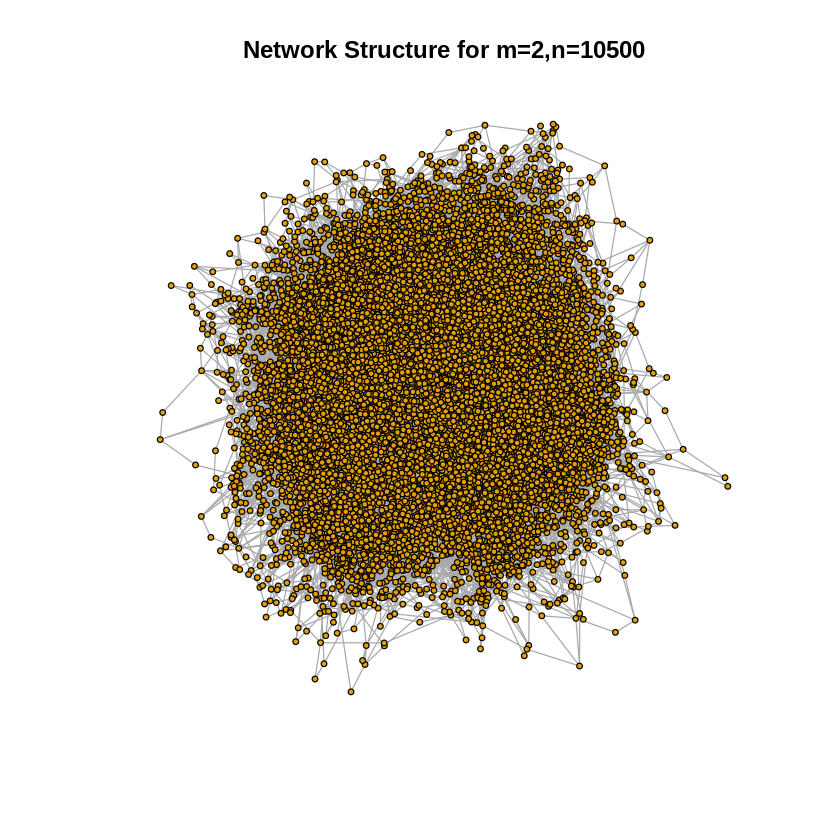

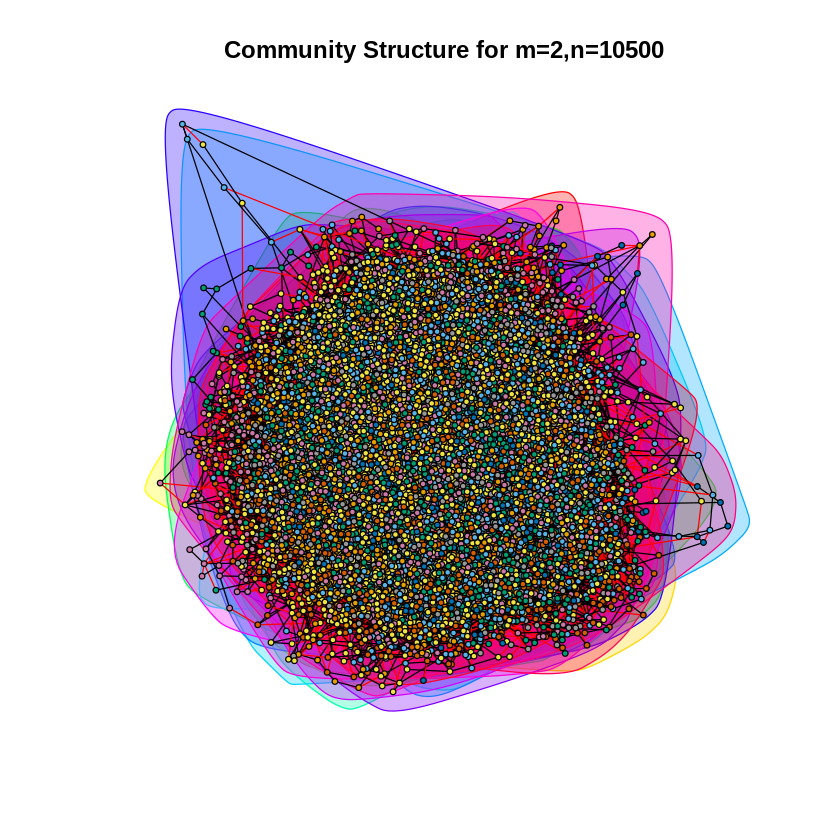

In [ ]:
paMod.large<-sample_pa(n=10500,m=m,directed=FALSE)
fg.large<-cluster_fast_greedy(paMod.large)
is_connected(paMod.large)
modularity(fg.large)
assortativity_degree(paMod.large)
plot(paMod.large,vertex.label='',vertex.size=2,main="Network Structure for m=2,n=10500")
plot(fg.large,y=paMod.large,vertex.label='',vertex.size=2,main="Community Structure for m=2,n=10500")

`geom_smooth()` using formula = 'y ~ x'


logK 
-2.16654

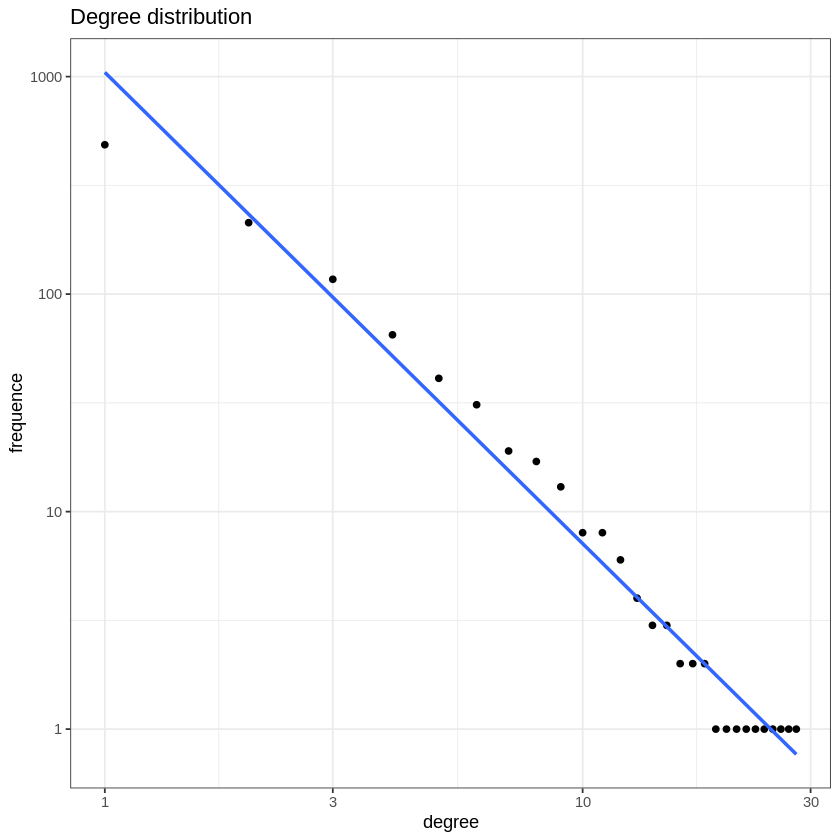

In [ ]:
plogdeg.pamod<-plotLogLogDeg(degree(paMod))
plogdeg.pamod$plot
plogdeg.pamod$slope

`geom_smooth()` using formula = 'y ~ x'


logK 
-2.483225

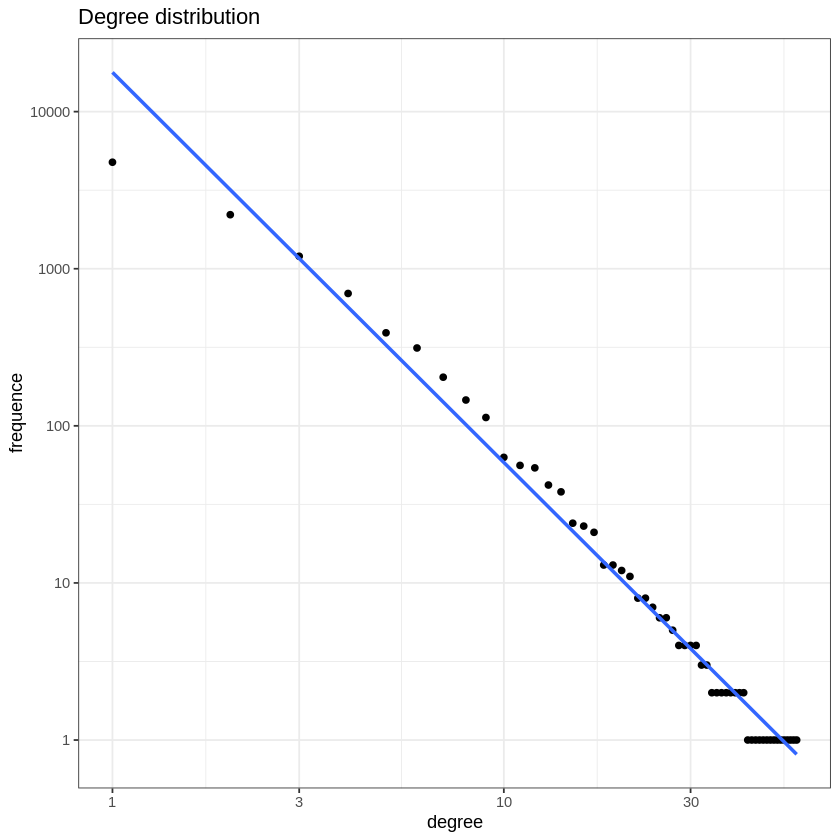

In [ ]:
plogdeg.pamod.large<-plotLogLogDeg(degree(paMod.large))
plogdeg.pamod.large$plot
plogdeg.pamod.large$slope

`geom_smooth()` using formula = 'y ~ x'


logK 
-1.292487

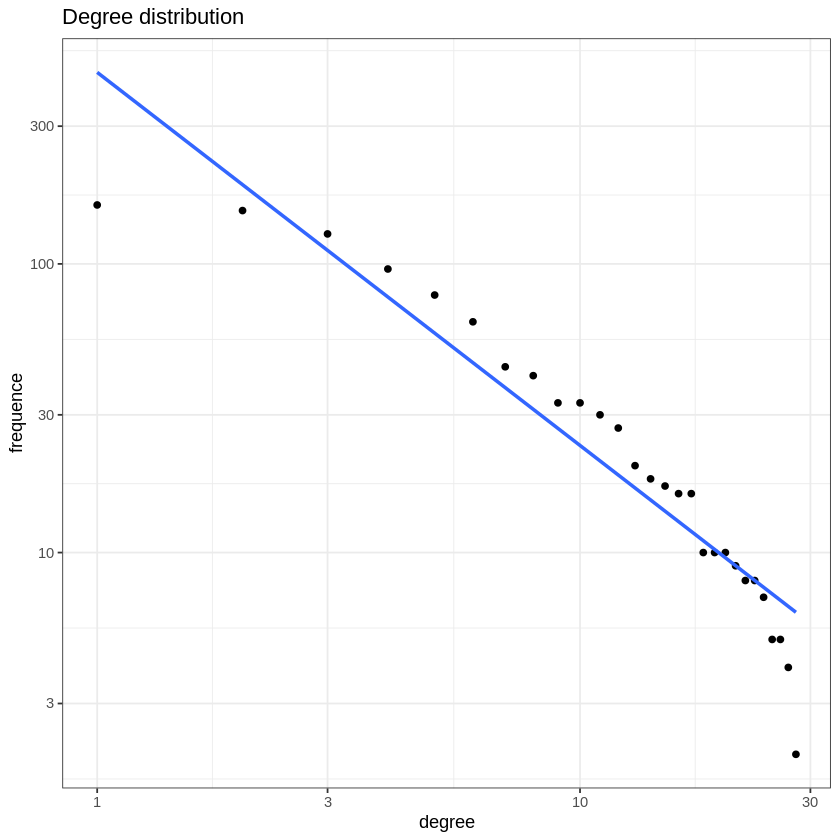

In [ ]:
si<-sample(1:gorder(paMod))
sj<-sapply(si,function(i) sample(neighbors(paMod,i),1))
sj.degree<-degree(paMod,sj)

plotLogLogDeg(sj.degree)$plot
plotLogLogDeg(sj.degree)$slope

`geom_smooth()` using formula = 'y ~ x'


logK 
-1.558152

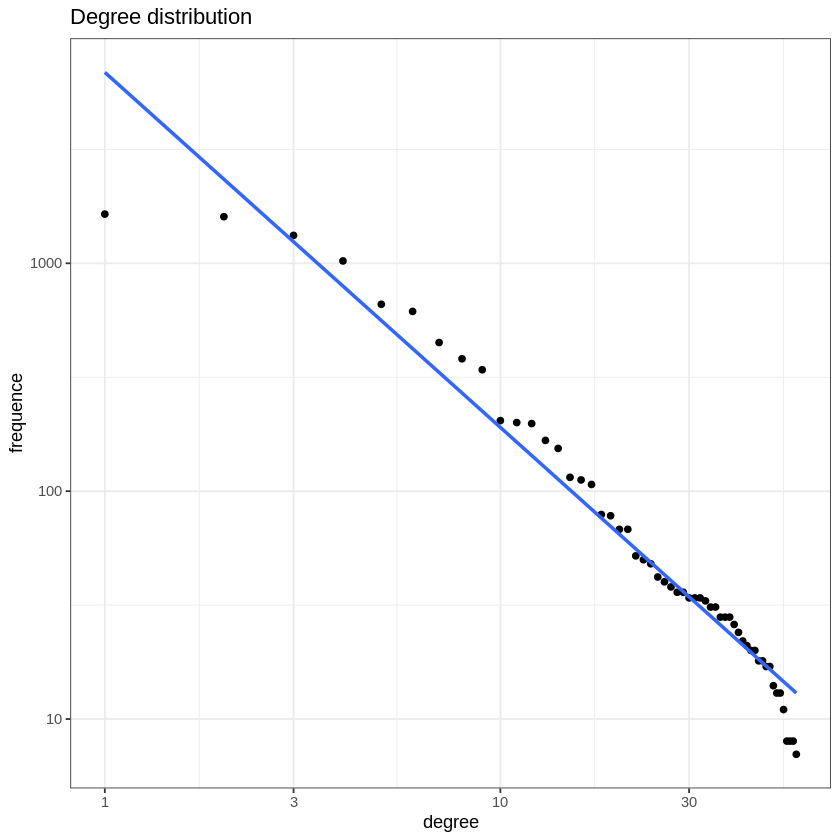

In [ ]:
si<-sample(1:gorder(paMod.large))
sj<-sapply(si,function(i) sample(neighbors(paMod.large,i),1))
sj.degree<-degree(paMod.large,sj)

plotLogLogDeg(sj.degree)$plot
plotLogLogDeg(sj.degree)$slope

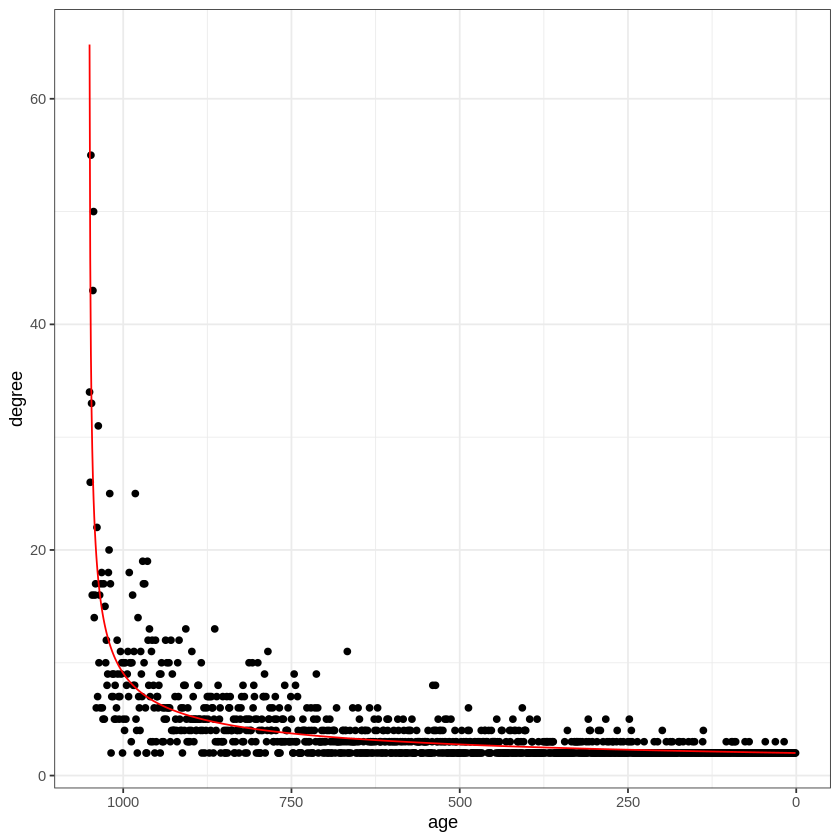

In [ ]:
t<-1050
i<-1:1050
degg<-m*sqrt(t/i)

data.frame(age=gorder(paMod):1,degree=degree(paMod)) |>
   ggplot(aes(x=age,y=degree))+
   geom_point()+
   theme_bw()+
   scale_x_reverse()+
   geom_line(data=data.frame(age=gorder(paMod):1,degree=degg),group='a',colour='red')

[1] TRUE

[1] 0.2412318

[1] -0.008612212

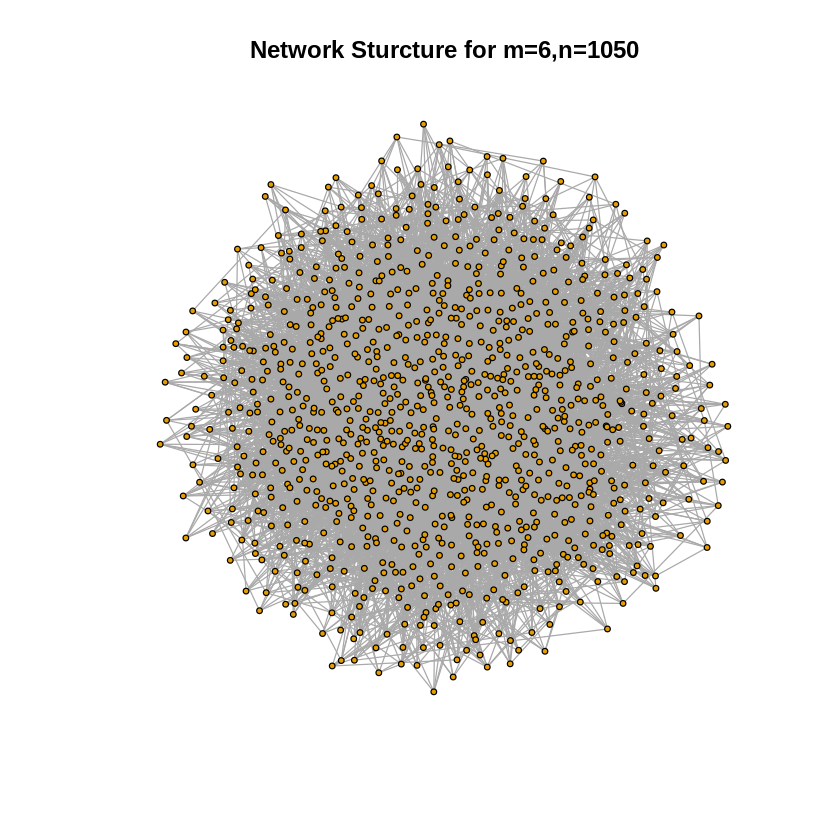

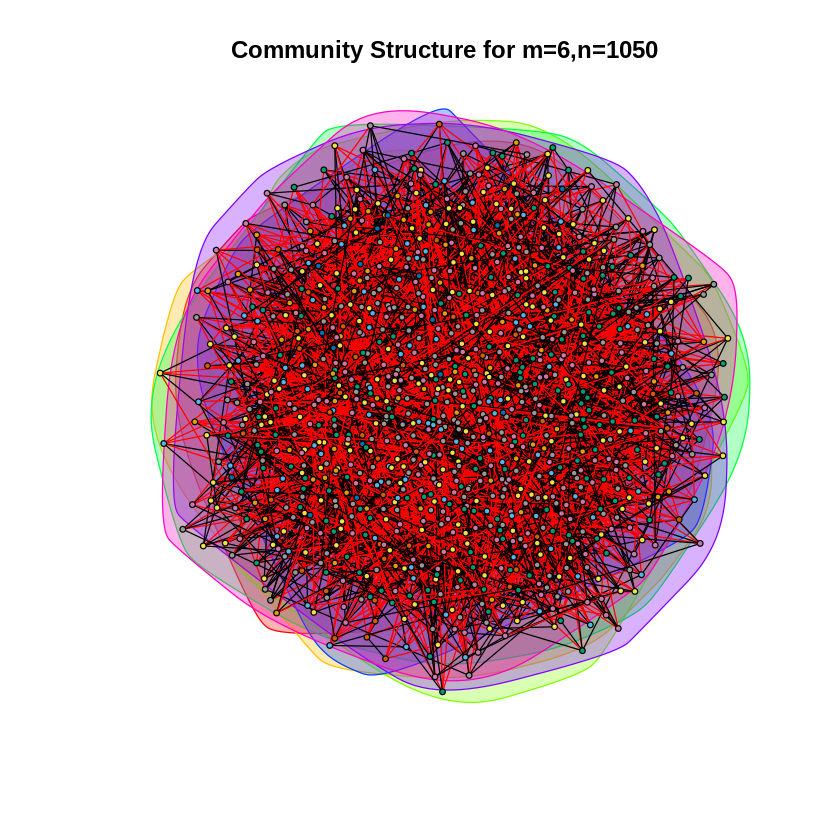

In [ ]:
m<-6
paMod<-sample_pa(n=1050,m=m,directed=FALSE)
is_connected(paMod)
fg<-cluster_fast_greedy(paMod)
modularity(fg)
assortativity_degree(paMod)
plot(paMod,vertex.label='',vertex.size=2,main="Network Sturcture for m=6,n=1050")
plot(fg,y=paMod,vertex.label='',vertex.size=2,main="Community Structure for m=6,n=1050")

[1] TRUE

[1] 0.2513718

[1] -0.002247741

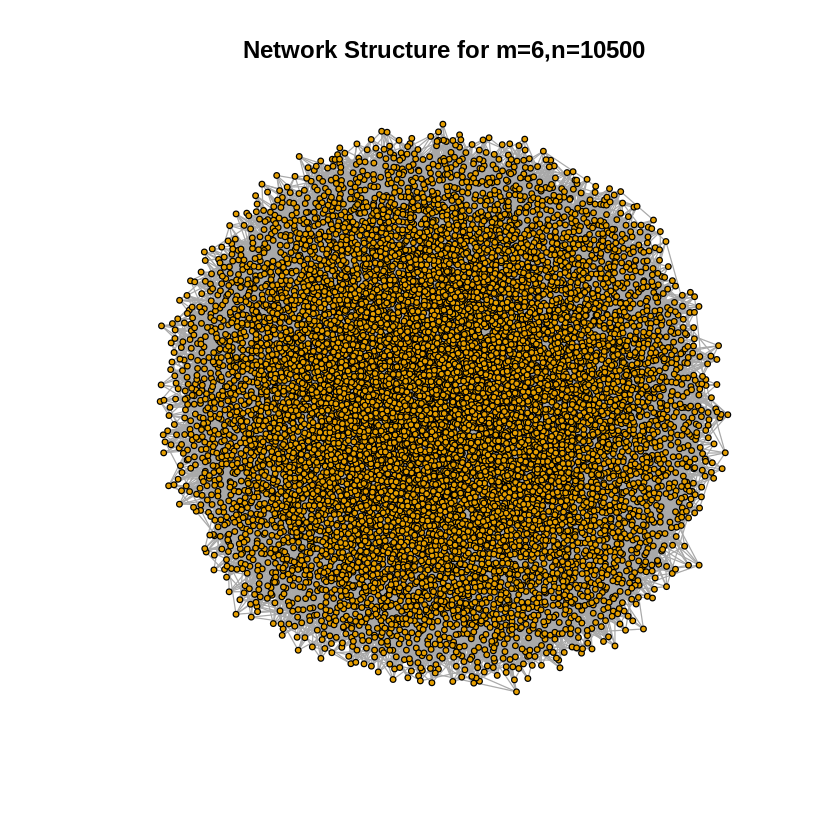

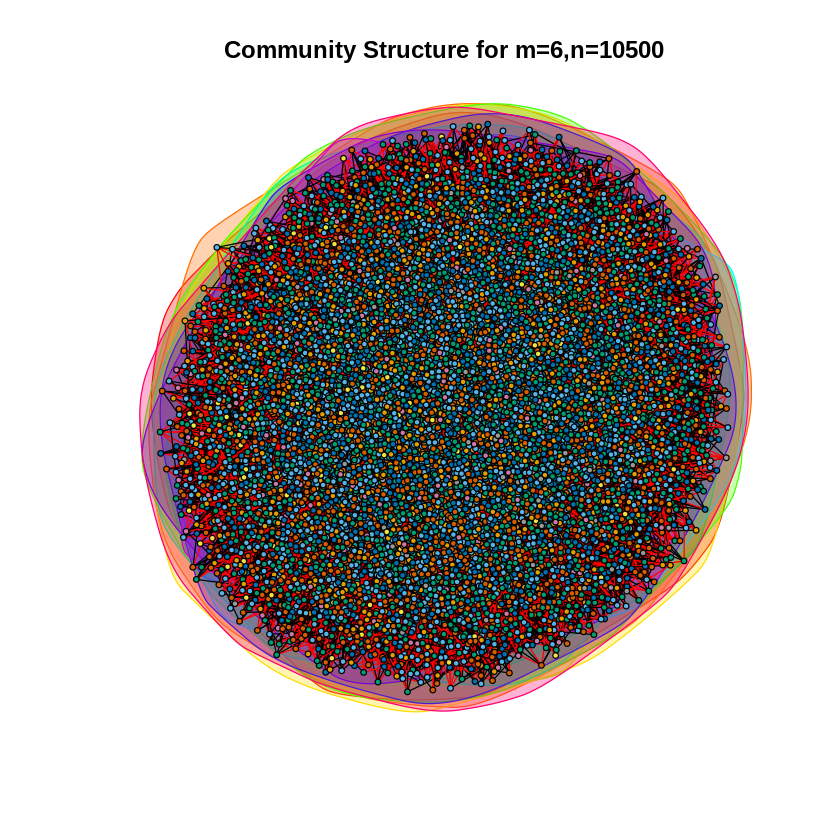

In [ ]:
paMod.large<-sample_pa(n=10500,m=m,directed=FALSE)
fg.large<-cluster_fast_greedy(paMod.large)
is_connected(paMod.large)
modularity(fg.large)
assortativity_degree(paMod.large)
plot(paMod.large,vertex.label='',vertex.size=2,main="Network Structure for m=6,n=10500")
plot(fg.large,y=paMod.large,vertex.label='',vertex.size=2,main="Community Structure for m=6,n=10500")

`geom_smooth()` using formula = 'y ~ x'


logK 
-1.745513

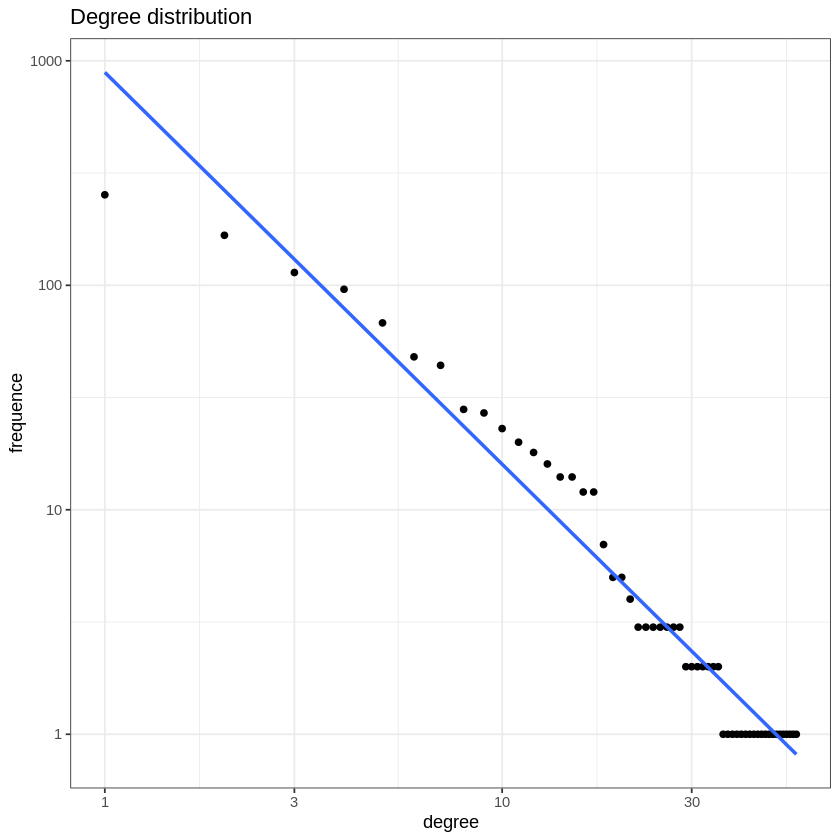

In [ ]:
plogdeg.pamod<-plotLogLogDeg(degree(paMod))
plogdeg.pamod$plot
plogdeg.pamod$slope

`geom_smooth()` using formula = 'y ~ x'


logK 
-2.150132

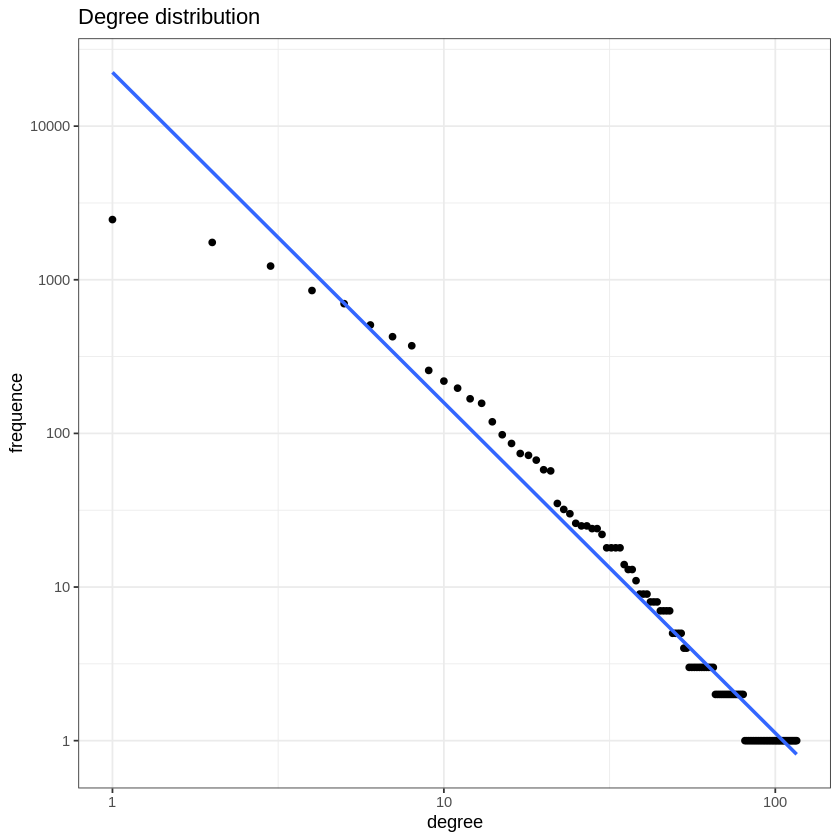

In [ ]:
plogdeg.pamod.large<-plotLogLogDeg(degree(paMod.large))
plogdeg.pamod.large$plot
plogdeg.pamod.large$slope

`geom_smooth()` using formula = 'y ~ x'


logK 
-1.086511

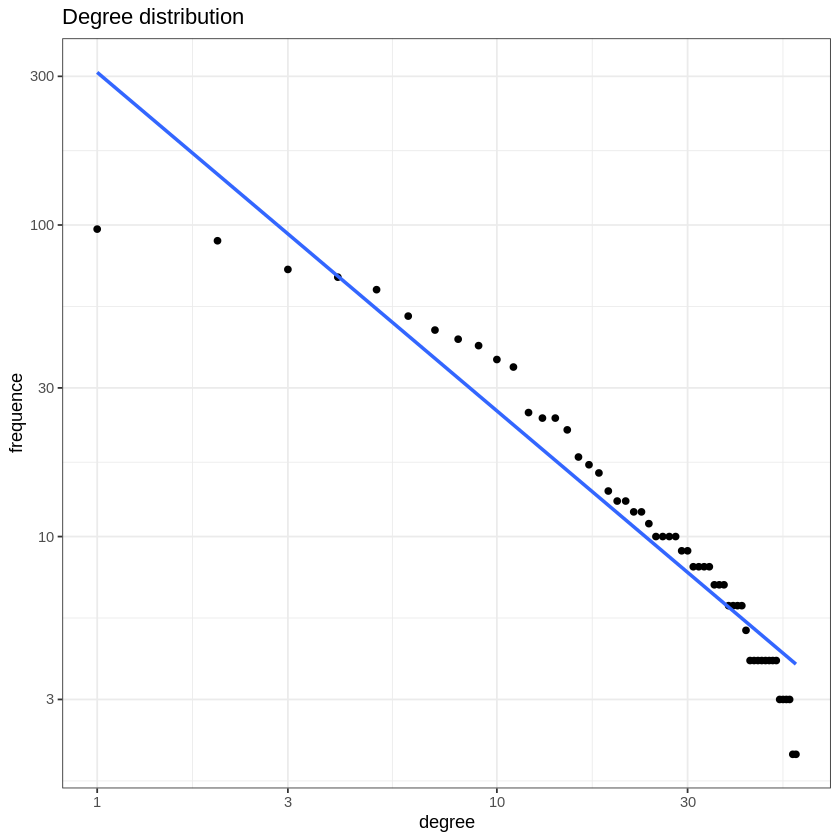

In [ ]:
si<-sample(1:gorder(paMod))
sj<-sapply(si,function(i) sample(neighbors(paMod,i),1))
sj.degree<-degree(paMod,sj)

plotLogLogDeg(sj.degree)$plot
plotLogLogDeg(sj.degree)$slope

`geom_smooth()` using formula = 'y ~ x'


logK 
-1.337763

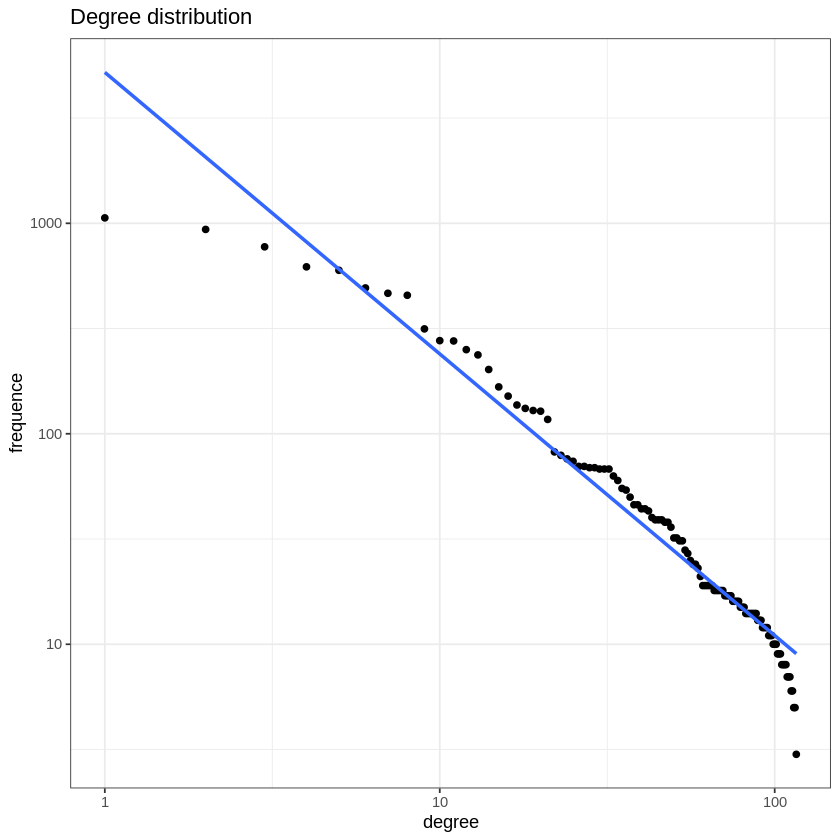

In [ ]:
si<-sample(1:gorder(paMod.large))
sj<-sapply(si,function(i) sample(neighbors(paMod.large,i),1))
sj.degree<-degree(paMod.large,sj)

plotLogLogDeg(sj.degree)$plot
plotLogLogDeg(sj.degree)$slope

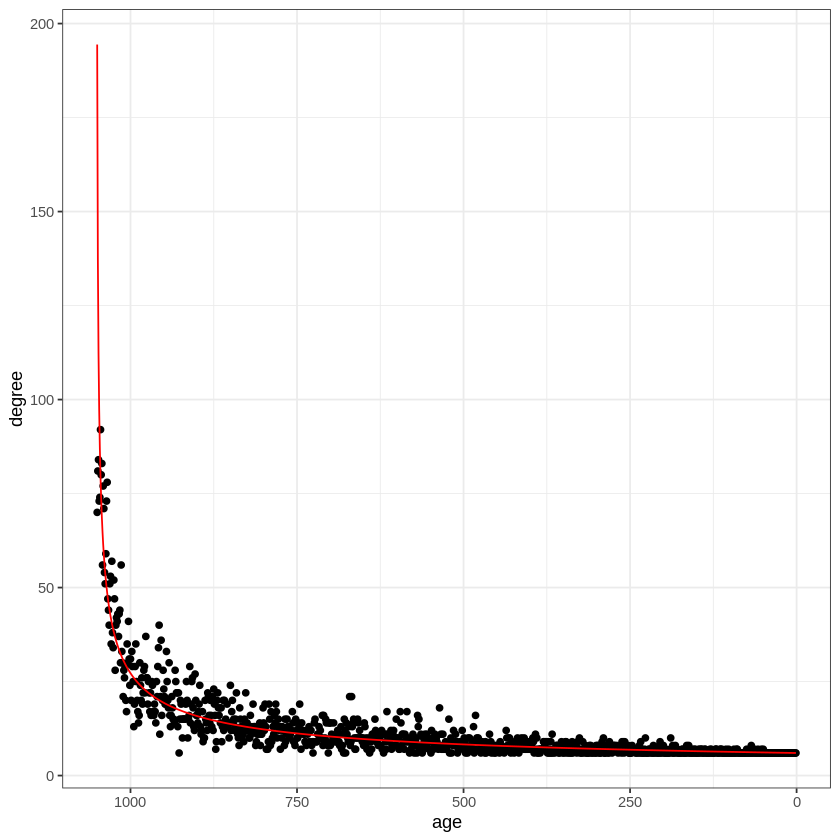

In [ ]:
t<-1050
i<-1:1050
degg<-m*sqrt(t/i)

data.frame(age=gorder(paMod):1,degree=degree(paMod)) |>
   ggplot(aes(x=age,y=degree))+
   geom_point()+
   theme_bw()+
   scale_x_reverse()+
   geom_line(data=data.frame(age=gorder(paMod):1,degree=degg),group='a',colour='red')

### (h)

[1] 0.8407535

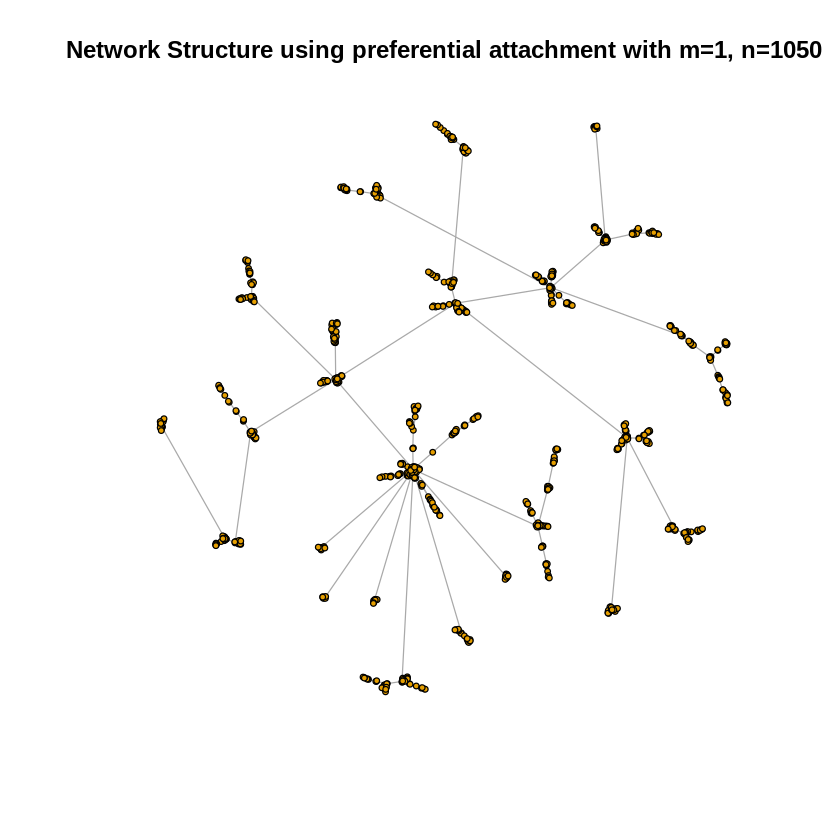

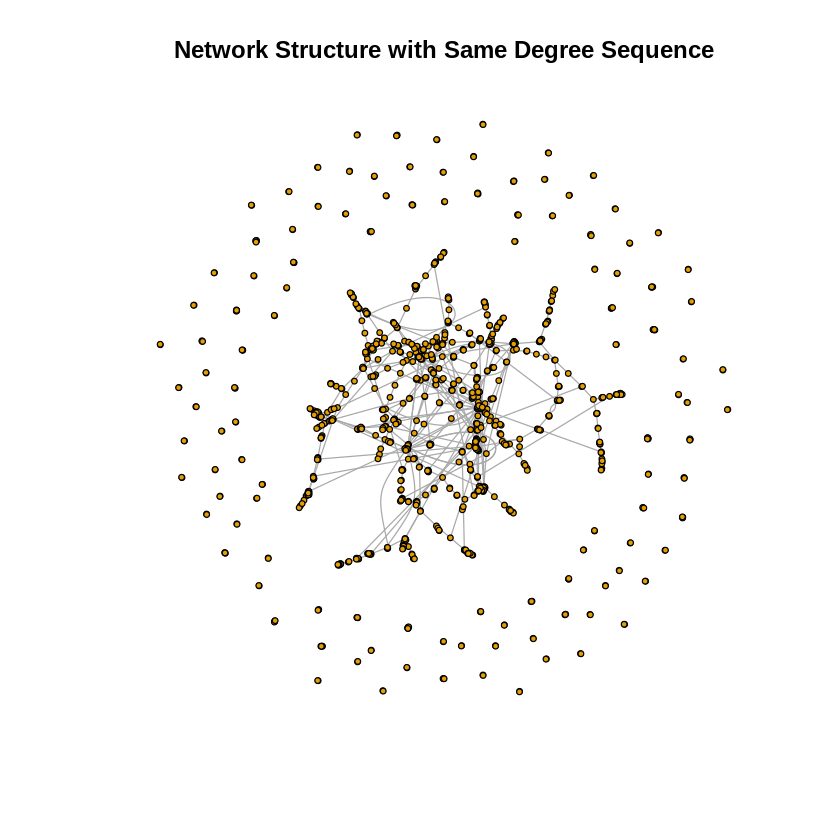

[1] 0.7586593

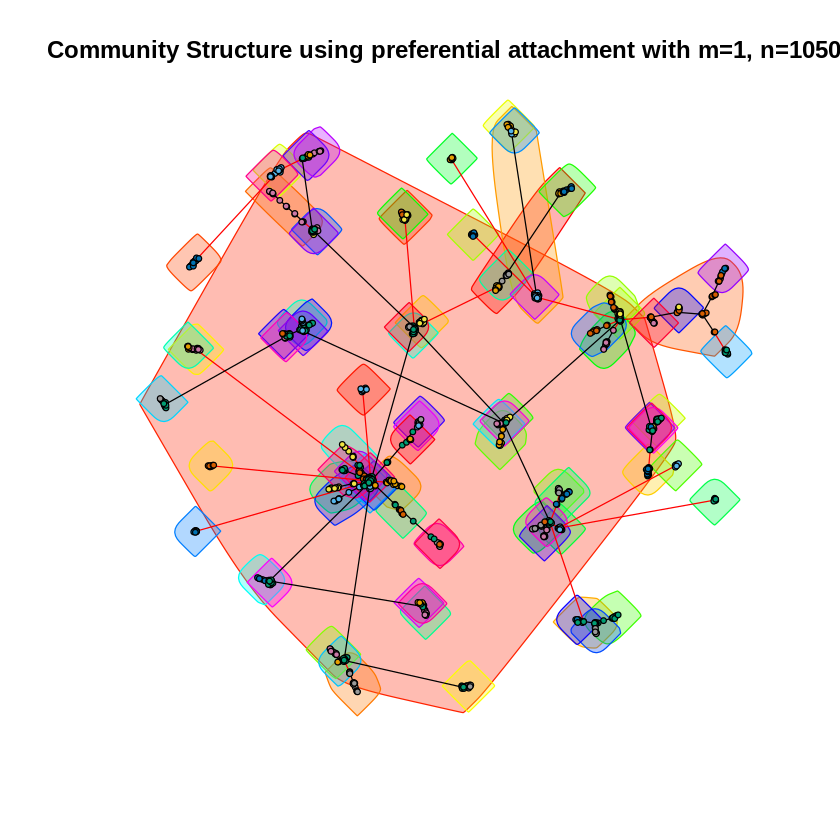

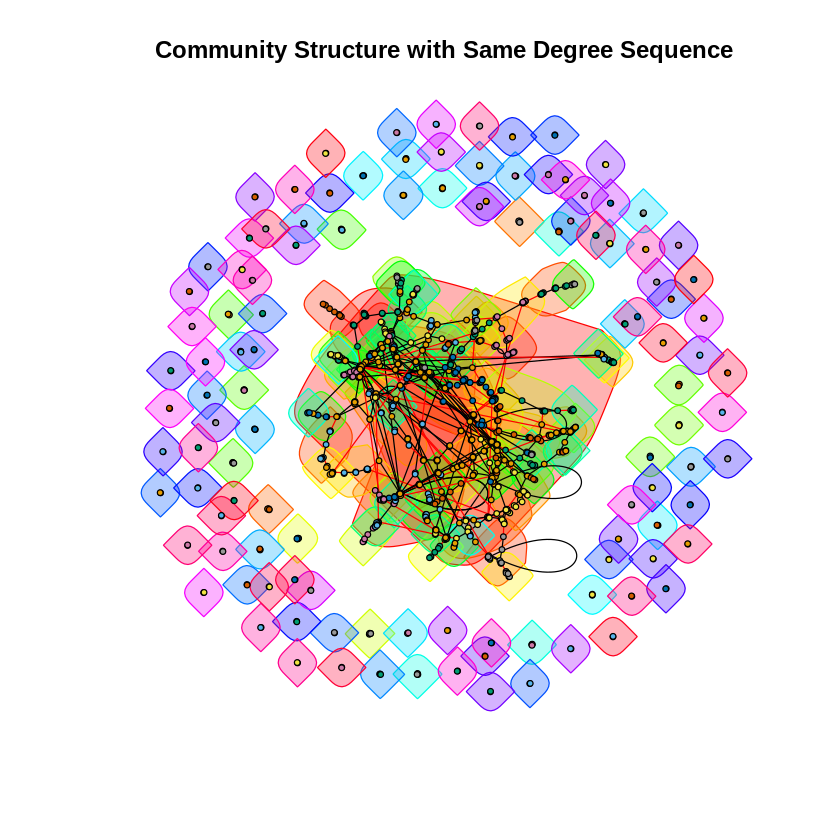

In [ ]:
paMod<-sample_pa(n=1050,m=1,directed=FALSE)
degseqMod<-sample_degseq(out.deg=degree(paMod))

comm.pa<-cluster_walktrap(paMod)
modularity(comm.pa)
plot(paMod,vertex.label='',vertex.size=2,main="Network Structure using preferential attachment with m=1, n=1050")
plot(degseqMod,vertex.label='',vertex.size=2,main="Network Structure with Same Degree Sequence")
plot(x=comm.pa,y=paMod,vertex.label='',vertex.size=2,main="Community Structure using preferential attachment with m=1, n=1050" )

comm.degseq<-cluster_walktrap(degseqMod)
modularity(comm.degseq)
plot(x=comm.degseq,y=degseqMod,vertex.label='',vertex.size=2,main="Community Structure with Same Degree Sequence")

# 3

### (a)

In [ ]:
install.packages("igraph")
install.packages("Matrix")
install.packages("pracma")

library('igraph')
library('Matrix')
library('pracma')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union



Attaching package: ‘pracma’


The following objects are masked from ‘package:Matrix’:

    expm, lu, tril, triu




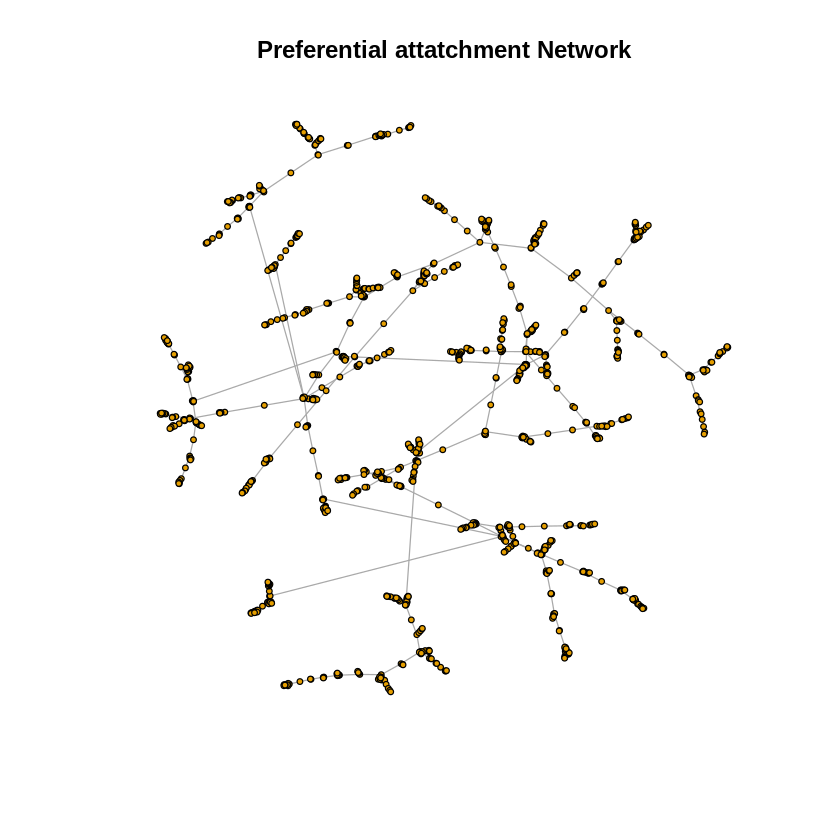

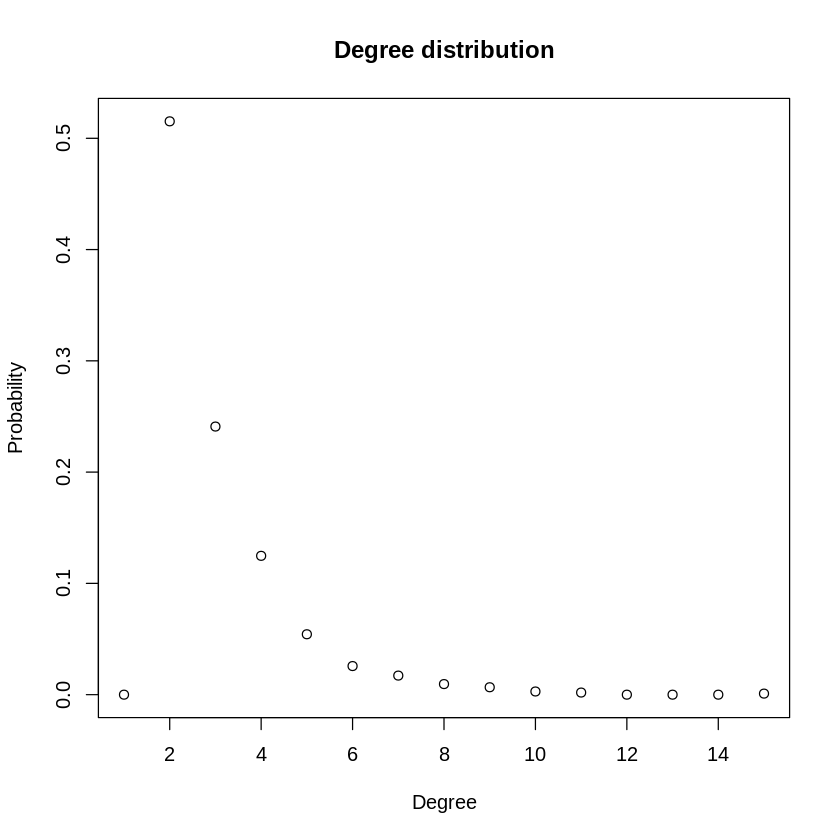

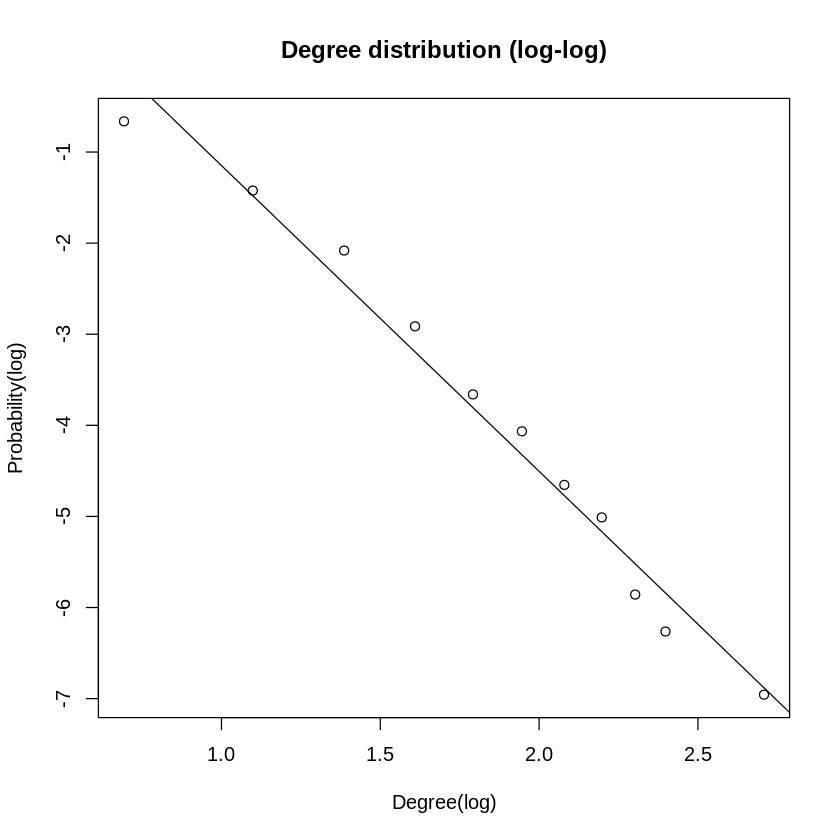

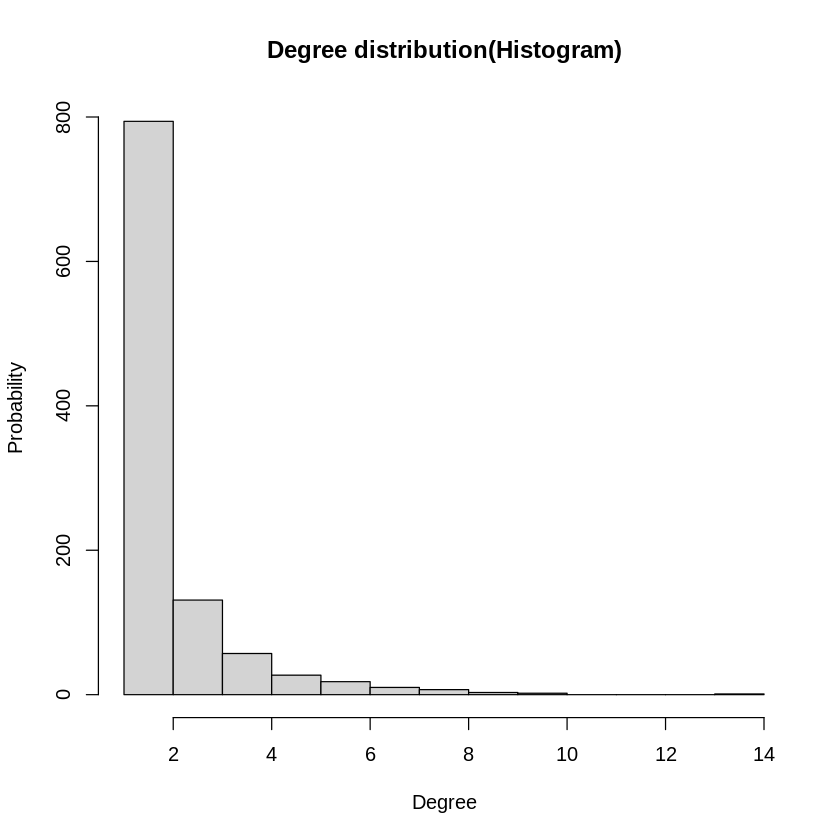

In [ ]:
n=1050
m=1
alpha=1
beta=-1
a=c=d=1
b=0

network=sample_pa_age(n=n, pa.exp = alpha, m=m, aging.exp = beta, zero.deg.appeal = a,
                zero.age.appeal = b, deg.coef = c, age.coef = d ,aging.bin=1050, 
                directed = FALSE)

plot(network,vertex.label="", vertex.size=2, main="Preferential attatchment Network")

deg_distribution=degree.distribution(network)

#log
idx=which(deg_distribution!=0,arr.ind = TRUE)
x=log(seq(1:length(deg_distribution)))[idx]
y=log(deg_distribution)[idx]

plot((deg_distribution),main = "Degree distribution",xlab = "Degree",ylab="Probability")
plot(x,y,abline(lm(y~x)),main="Degree distribution (log-log)",xlab="Degree(log)",ylab="Probability(log)")
hist(degree(network),main = "Degree distribution(Histogram)",xlab = "Degree", ylab = "Probability")


Power law exponent:

In [ ]:
print(lm(y~x))


Call:
lm(formula = y ~ x)

Coefficients:
(Intercept)            x  
      2.208       -3.356  



### (b)


Modularity is  0.936709435923814

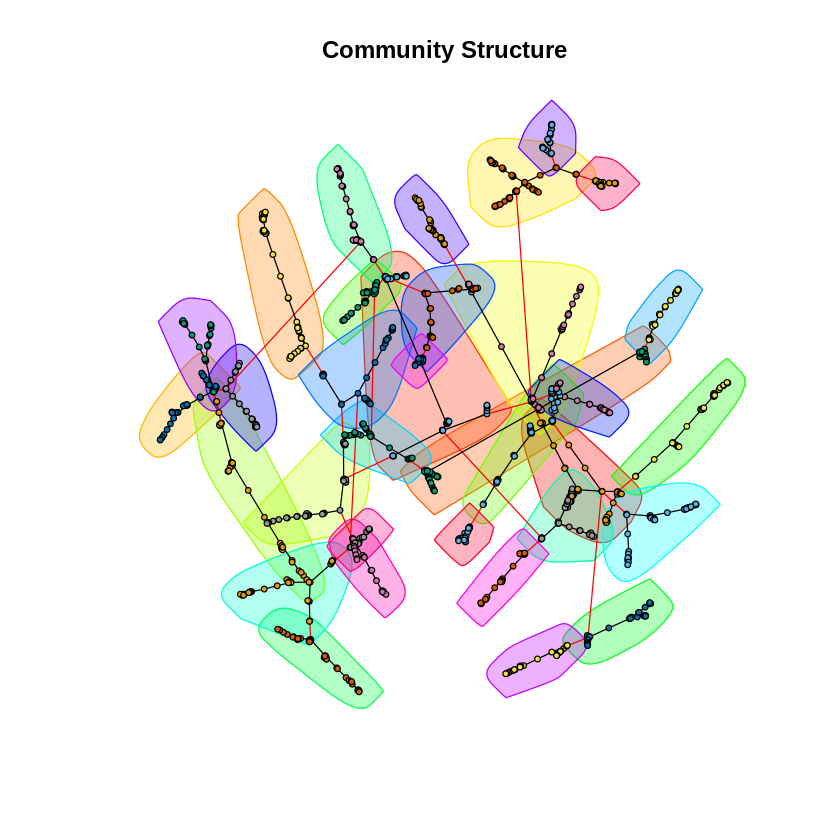

In [ ]:
network_comm=cluster_fast_greedy(network)
network_modu=modularity(network_comm)
plot(network_comm,network,main="Community Structure",vertex.size=2, vertex.label=NA)

cat(paste("\nModularity is ", network_modu))

### **Part 2**

### 1.Random walk on Erd¨os-R´enyi networks

### (a)

In [ ]:
install.packages("resample")
library('resample')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



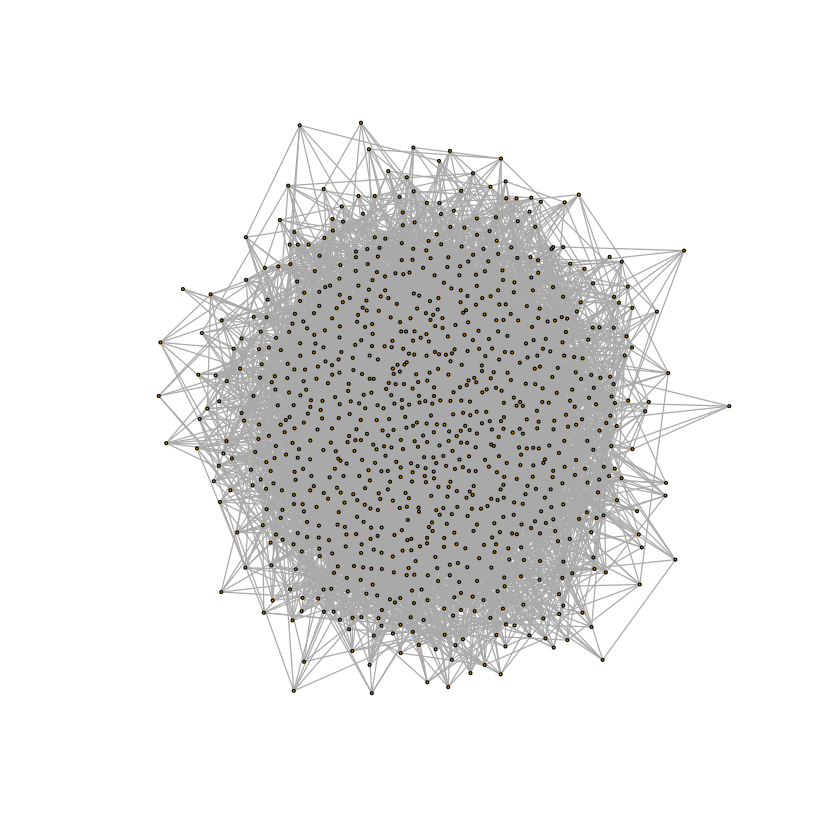

In [ ]:
g <- sample_gnp(n=900, p=0.015, directed=F)
plot(g, vertex.size=1, vertex.label=NA)

### (b)

In [ ]:
#number of steps: 100
t = 100
vertex = c(1:t)

In [ ]:
create_transition_matrix = function (g){
  vs = V(g)
  n = vcount(g)
  adj = as_adjacency_matrix(g)
  adj[diag(rowSums(adj) == 0)] = 1  
  z = matrix(rowSums(adj, , 1))
  
  transition_matrix = adj / repmat(z, 1, n) 

  return(transition_matrix)
}

In [ ]:
random_walk = function (g, num_steps, start_node, transition_matrix = NULL){
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    for(i in 1:num_steps){
        vertex[i] = v
        PMF = transition_matrix[v, ]
        v = sample(1:vcount(g), 1, prob = PMF)
        if(i == t)
          node_degree = degree(g,v)
    }
   return(list(distances = vertex,degrees = node_degree))
}

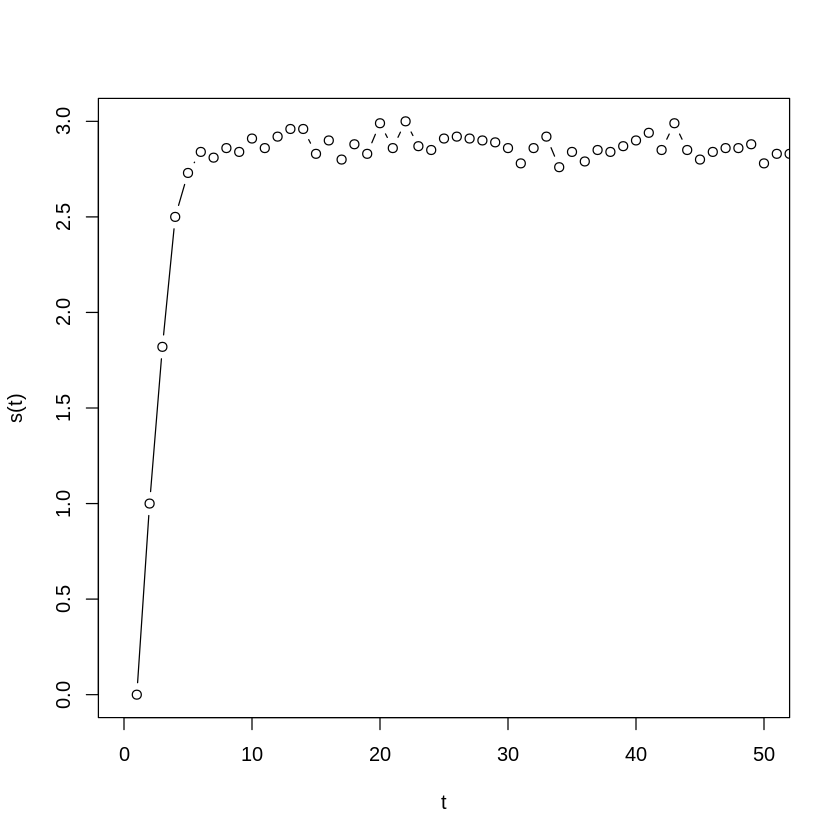

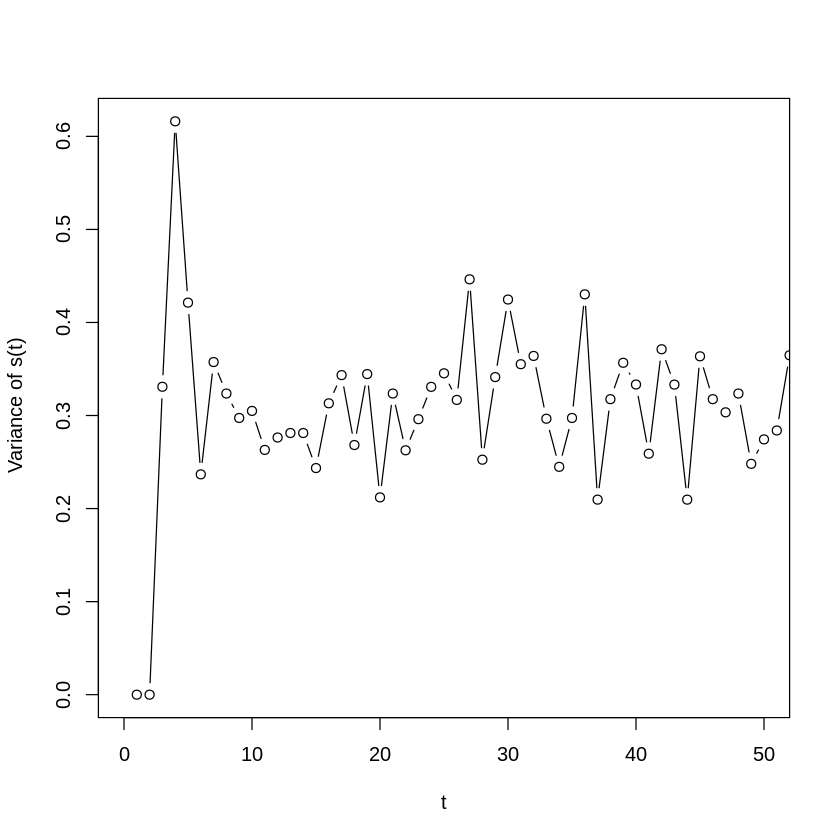

In [ ]:
#100 steps, 100 iterations
degrees = c(1:100)
iters = 100
short_distances = matrix(NA, nrow=iters, ncol=t)
start_nodes = sample(1:vcount(g),100)

#perform random walker for 100 times
for(i in 1:iters){
    result = random_walk(g,t,start_nodes[i])
    distance = result[['distances']]
    end_node_degree = result[['degrees']][1]

    short_distances[i,] = shortest.paths(g,distance,start_nodes[i])
    degrees[i] = end_node_degree
}

plot(colMeans(short_distances),type="b", xlab='t', ylab='s(t)', xlim=c(0,50))
plot(colVars(short_distances),type="b", xlab='t', ylab=' Variance of s(t)', xlim=c(0,50))

### (c)

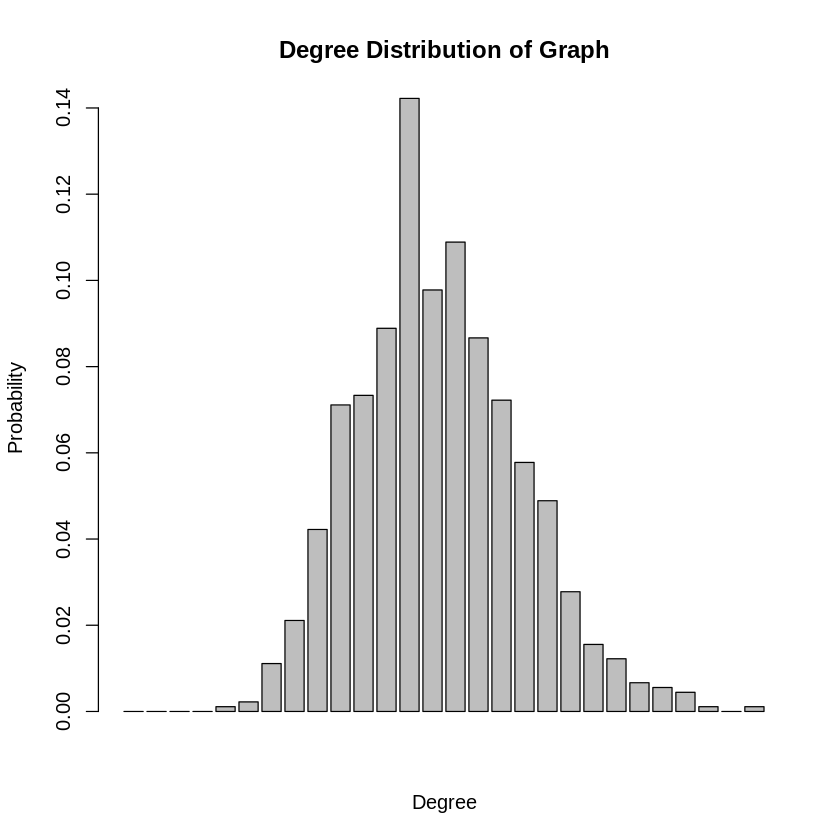

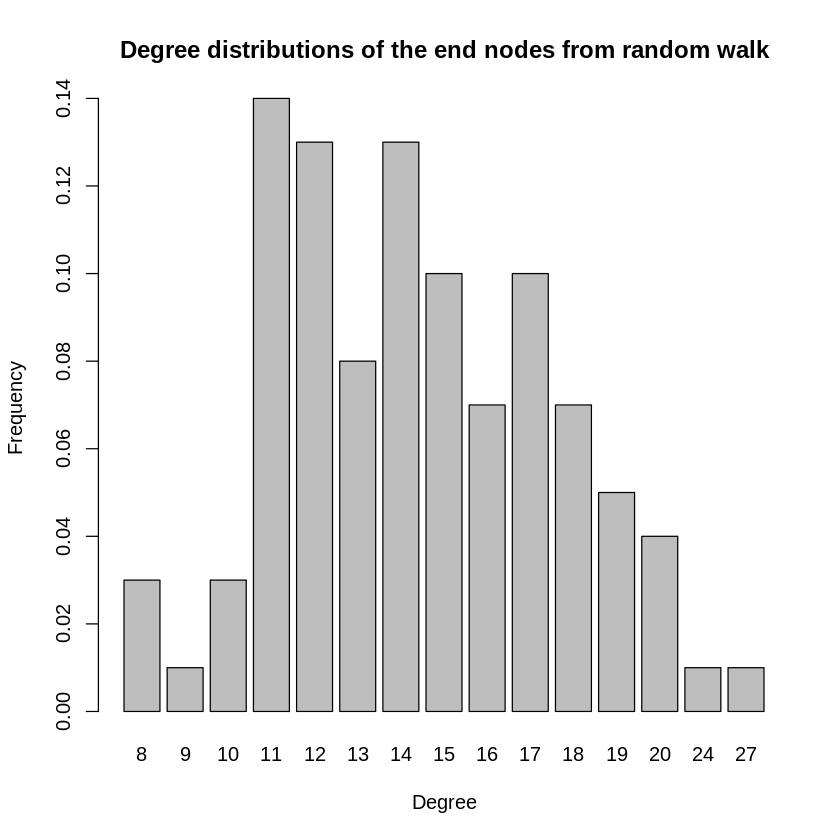

In [ ]:
degree_graph = degree.distribution(g)
barplot(degree_graph, xlab="Degree", ylab="Probability", main = "Degree Distribution of Graph")

degree_endnode = table(degrees)/length(degrees)
barplot(degree_endnode, xlab="Degree", ylab="Frequency", main = "Degree distributions of the end nodes from random walk")

### (d)

In [ ]:
g2 = random.graph.game(9000, 0.015, directed=F)

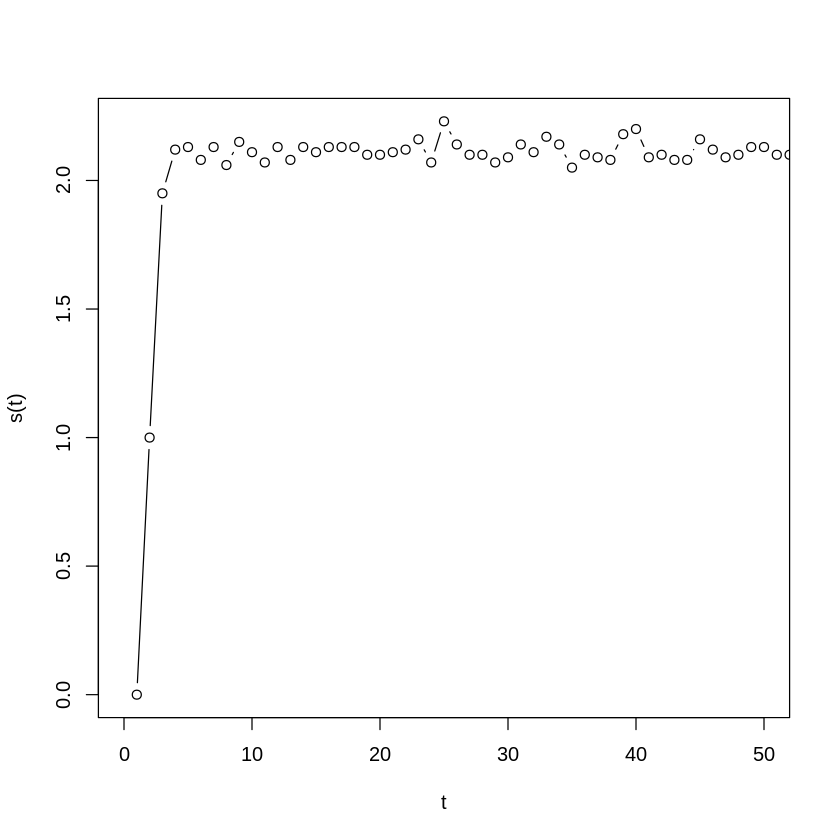

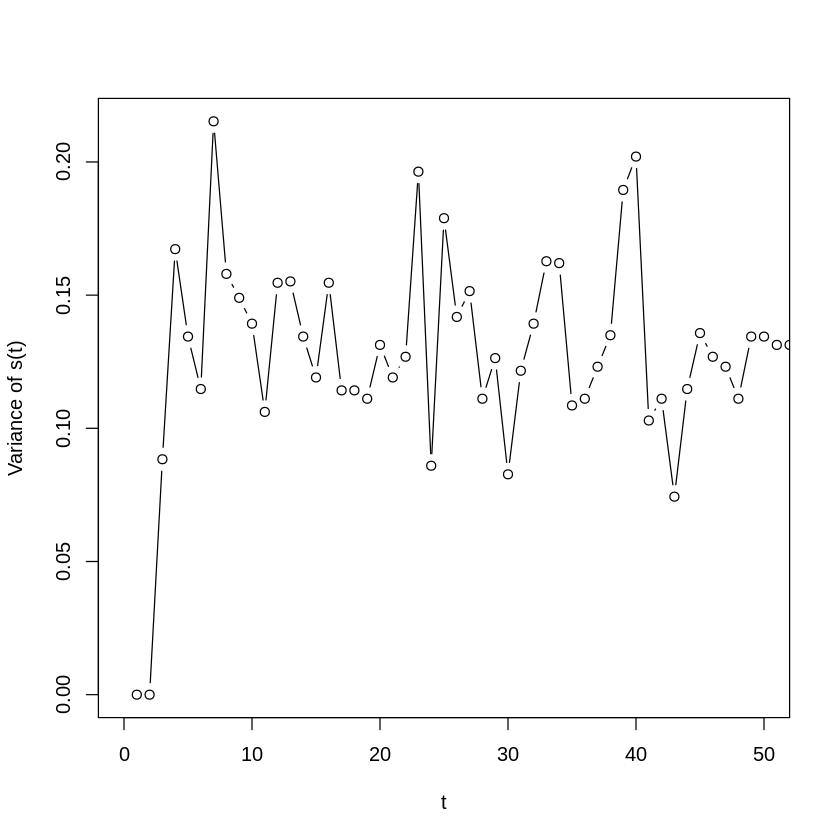

In [ ]:
degrees = c(1:100)
iters = 100
short_distances = matrix(NA, nrow=iters, ncol=t)
start_nodes = sample(1:vcount(g2),100)

#perform random walker for 100 times
for(i in 1:iters){
    result = random_walk(g2,t,start_nodes[i])
    distance = result[['distances']]
    end_node_degree = result[['degrees']][1]

    short_distances[i,] = shortest.paths(g2,distance,start_nodes[i])
    degrees[i] = end_node_degree
}

plot(colMeans(short_distances),type="b", xlab='t', ylab='s(t)', xlim=c(0,50))
plot(colVars(short_distances),type="b", xlab='t', ylab='Variance of s(t)', xlim=c(0,50))

In [ ]:
diameter(g)
diameter(g2)

[1] 4

[1] 3

### 2. Random walk on networks with fat-tailed degree distribution

### (a)

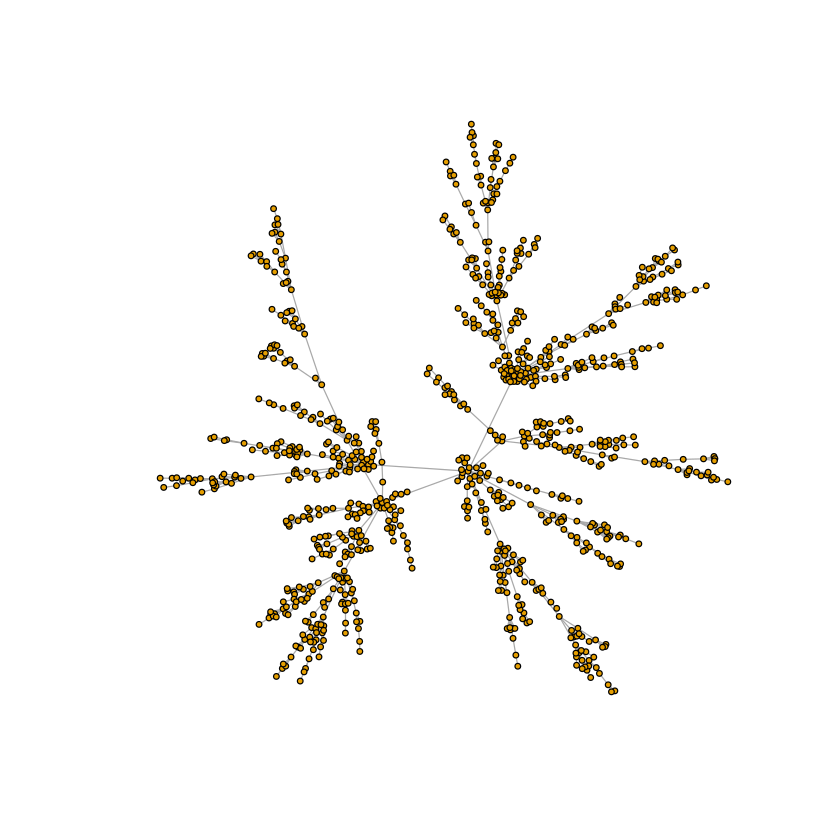

In [ ]:
g3 <- sample_pa(n=900, m=1, directed=F)
plot(g3, vertex.size=2, vertex.label=NA)

### (b)

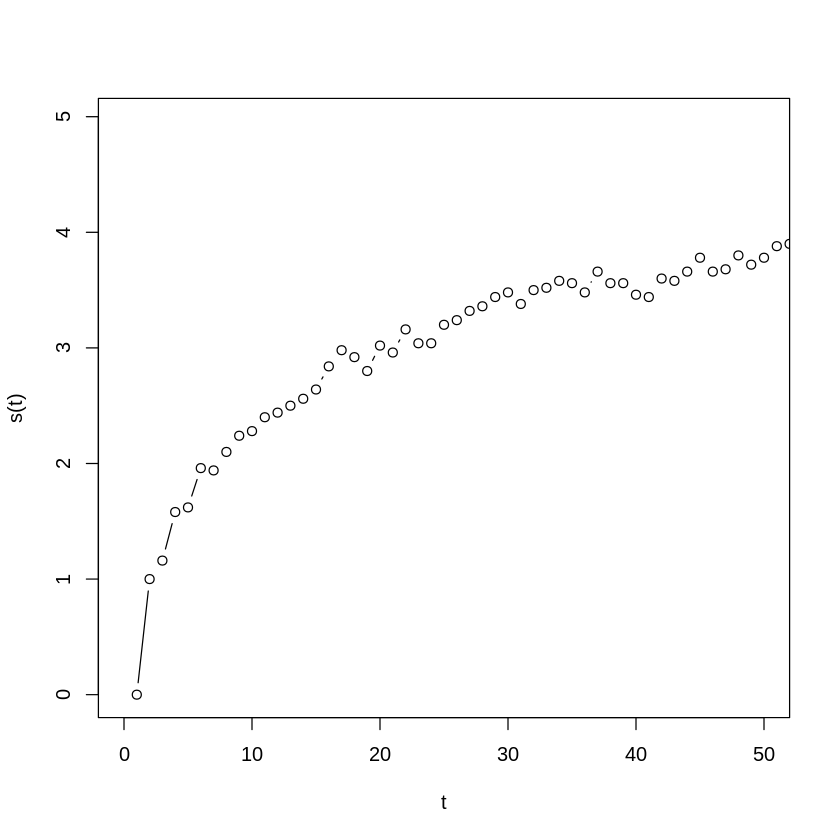

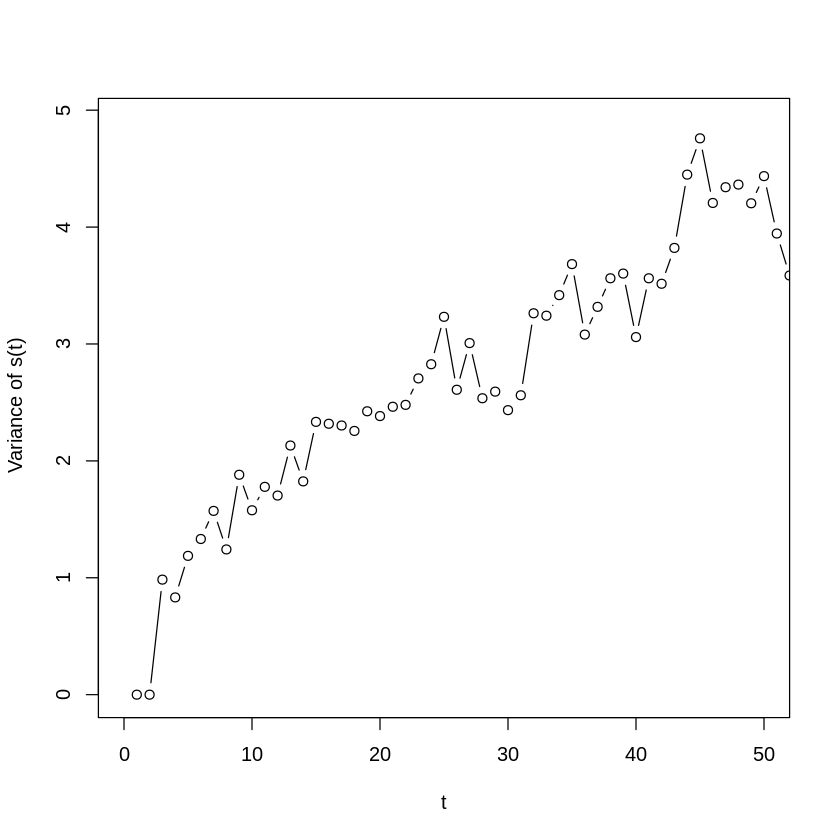

In [ ]:
degrees = c(1:100)
iters = 100
short_distances = matrix(NA, nrow=iters, ncol=t)
start_nodes = sample(1:vcount(g3),100)

#perform random walker for 100 times
for(i in 1:iters){
    result = random_walk(g3,t,start_nodes[i])
    distance = result[['distances']]
    end_node_degree = result[['degrees']][1]

    short_distances[i,] = shortest.paths(g3,distance,start_nodes[i])
    degrees[i] = end_node_degree
}

plot(colMeans(short_distances),type="b", xlab='t', ylab='s(t)', xlim=c(0,50))
plot(colVars(short_distances),type="b", xlab='t', ylab=' Variance of s(t)', xlim=c(0,50))

### (c)

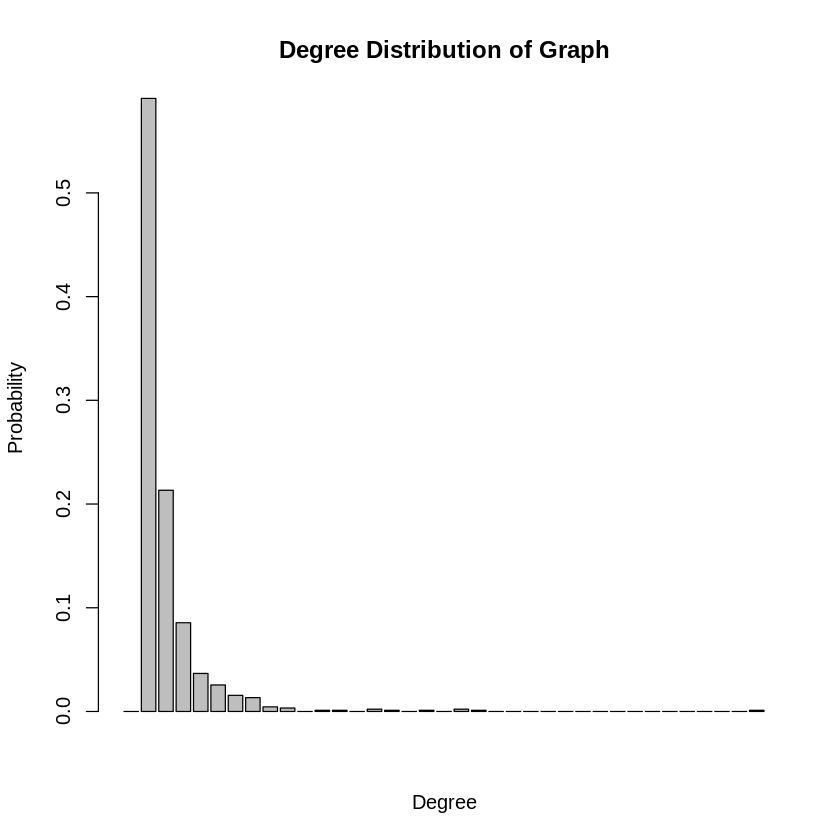

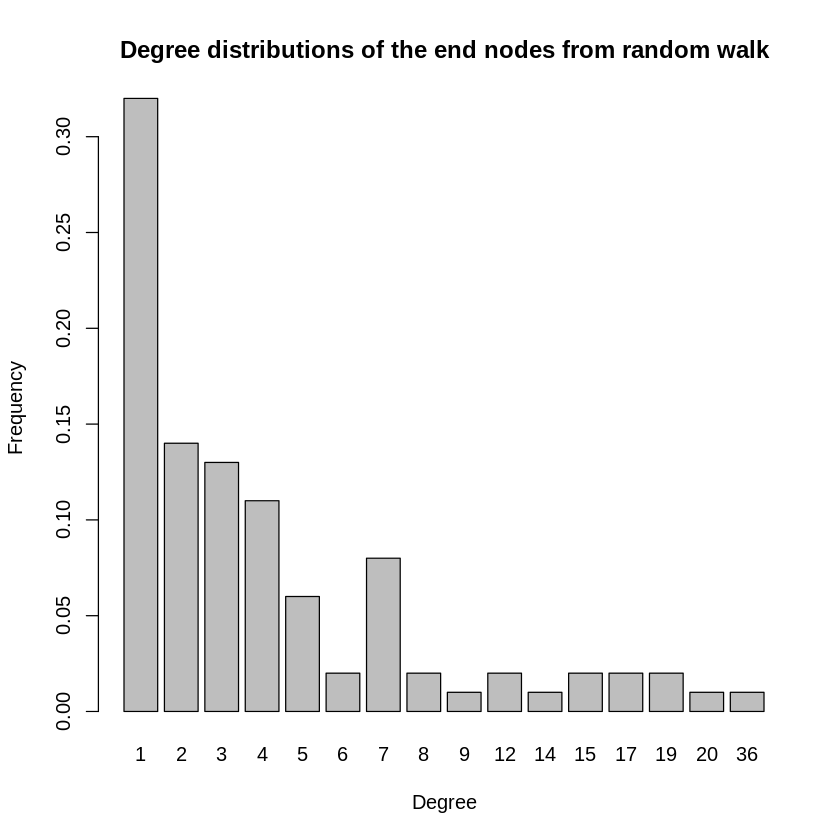

In [ ]:
degree_graph = degree.distribution(g3)
barplot(degree_graph, xlab="Degree", ylab="Probability", main = "Degree Distribution of Graph")

degree_endnode = table(degrees)/length(degrees)
barplot(degree_endnode, xlab="Degree", ylab="Frequency", main = "Degree distributions of the end nodes from random walk")

### (d)

In [ ]:
g4 <- sample_pa(n=90, m=1, directed=F)
g5 <- sample_pa(n=9000, m=1, directed=F)

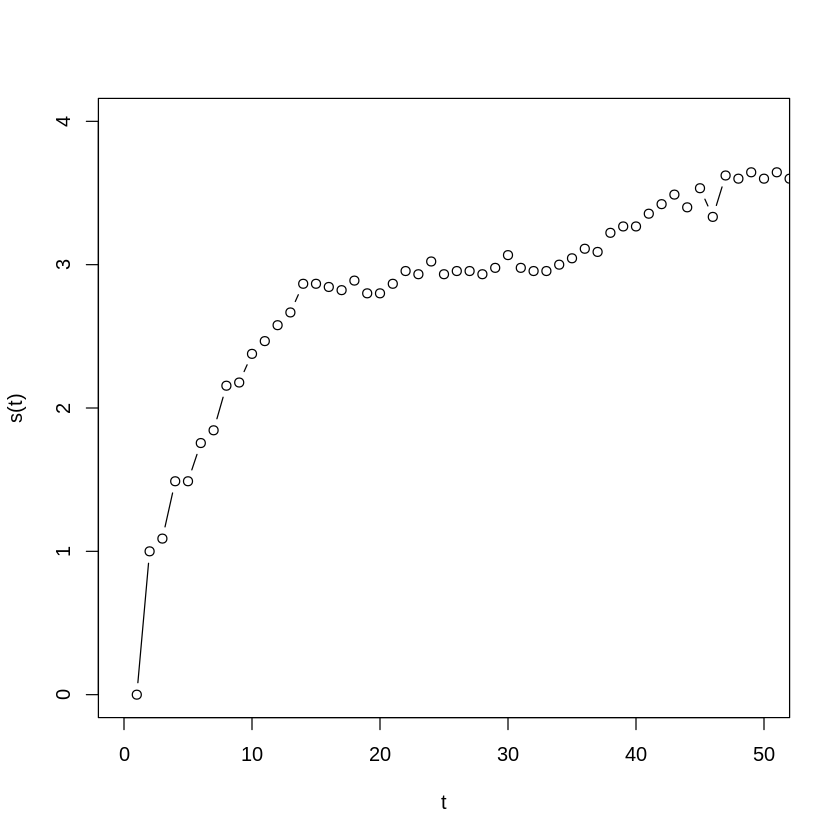

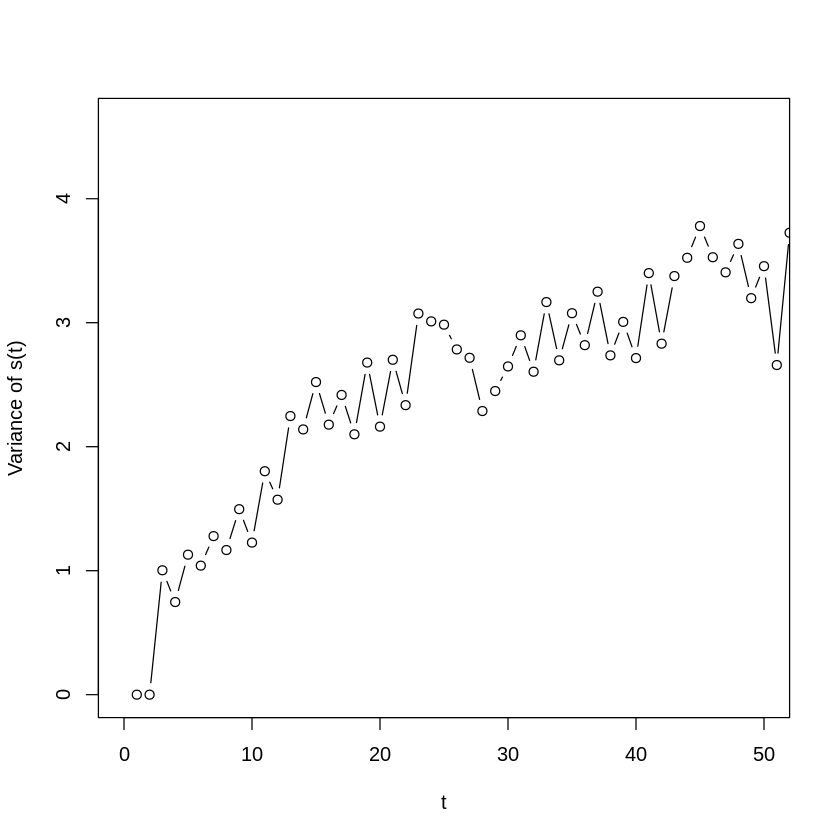

In [ ]:
degrees = c(1:90)
iters = 90
short_distances = matrix(NA, nrow=iters, ncol=t)
start_nodes = sample(1:vcount(g4),90)

#perform random walker for 90 times (adjusted accordingly)
for(i in 1:iters){
    result = random_walk(g4,t,start_nodes[i])
    distance = result[['distances']]
    end_node_degree = result[['degrees']][1]

    short_distances[i,] = shortest.paths(g4,distance,start_nodes[i])
    degrees[i] = end_node_degree
}

plot(colMeans(short_distances),type="b", xlab='t', ylab='s(t)', xlim=c(0,50))
plot(colVars(short_distances),type="b", xlab='t', ylab='Variance of s(t)', xlim=c(0,50))

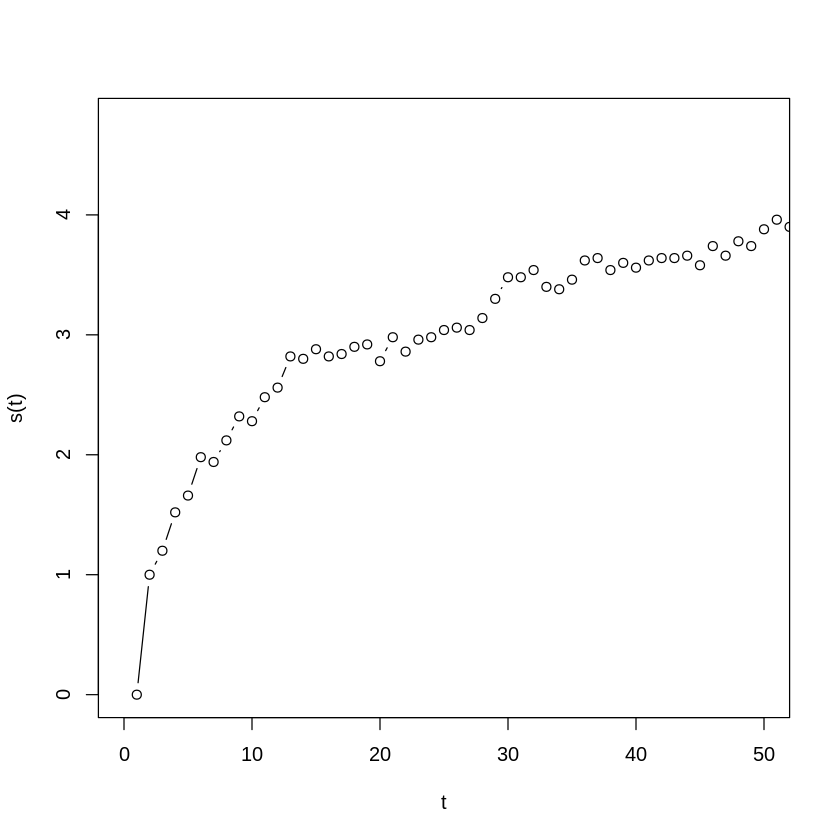

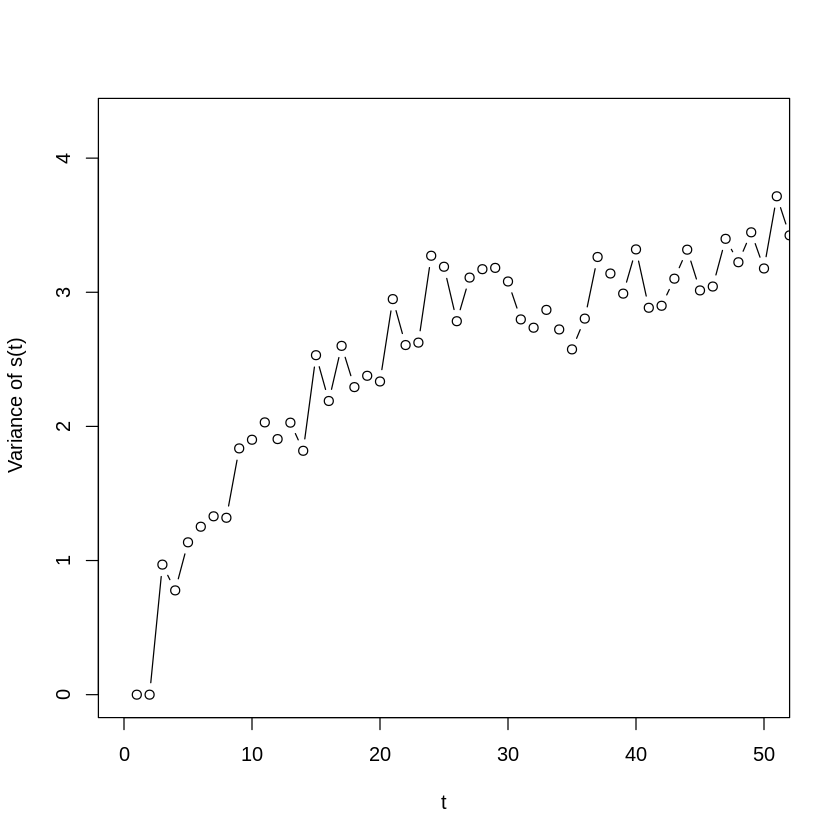

In [ ]:
degrees = c(1:100)
iters = 100
short_distances = matrix(NA, nrow=iters, ncol=t)
start_nodes = sample(1:vcount(g5),100)

#perform random walker for 100 times
for(i in 1:iters){
    result = random_walk(g5,t,start_nodes[i])
    distance = result[['distances']]
    end_node_degree = result[['degrees']][1]

    short_distances[i,] = shortest.paths(g5,distance,start_nodes[i])
    degrees[i] = end_node_degree
}

plot(colMeans(short_distances),type="b", xlab='t', ylab='s(t)', xlim=c(0,50))
plot(colVars(short_distances),type="b", xlab='t', ylab=' Variance of s(t)', xlim=c(0,50))

In [ ]:
diameter(g4)
diameter(g5)

[1] 11

[1] 32

### 3. PageRank

### 3a

In [ ]:
install.packages("igraph")
install.packages("pracma")
install.packages("Matrix")
library('igraph')
library('Matrix')
library('pracma')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
# Transition Matrix and Random Walk function (TA given)
create_transition_matrix = function (g){
  # WARNING: make sure your graph is connected (you might input GCC of your graph)
  vs = V(g)
  n = vcount(g)
  adj = as_adjacency_matrix(g)
  adj[diag(rowSums(adj) == 0)] = 1  # handle if the user is using the function for networks with isolated nodes by creating self-edges
  z = matrix(rowSums(adj, , 1))
  
  transition_matrix = adj / repmat(z, 1, n)  # normalize to get probabilities
  
  return(transition_matrix)
}

random_walk = function (g, num_steps, start_node, transition_matrix = NULL){
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    for(i in 1:num_steps){
        #fprintf('Step %d: %d\n', i, v)  # COMMENT THIS
        PMF = transition_matrix[v, ]
        v = sample(1:vcount(g), 1, prob = PMF)        
    }
    
    return(v)
}

In [ ]:
graph3a_1 = barabasi.game(n = 900, m = 4, directed = TRUE)
graph3a_2 = barabasi.game(n = 900, m = 4, directed = TRUE)
graph3a_2 = permute(graph3a_2, sample(1:vcount(graph3a_2)))
edgelist = as_edgelist(graph3a_2)
graph3a = add_edges(graph3a_1, t(edgelist))## merged graph
frequency = rep(0, vcount(graph3a))
all_fre = rep(0, vcount(graph3a))
for(i in 1:500){
  start_node = sample(1:vcount(graph3a), 1)
  rw_nodes = random_walk(graph3a , num_steps = 900, start_node, transition_matrix = create_transition_matrix(graph3a))
  frequency[rw_nodes] = frequency[rw_nodes] + 1
  all_fre = all_fre + frequency
}


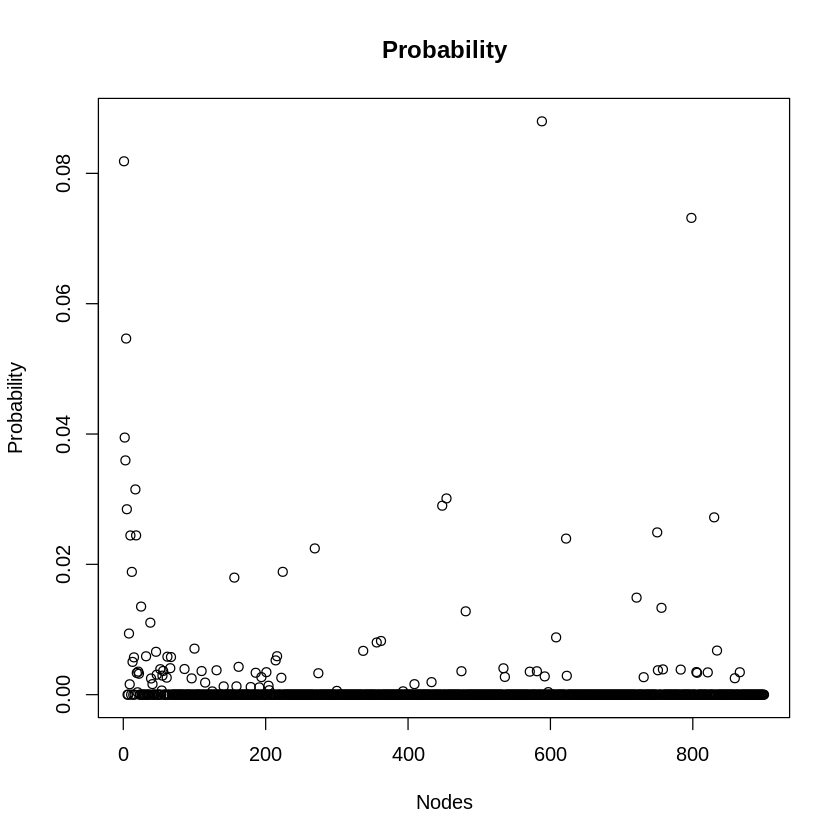

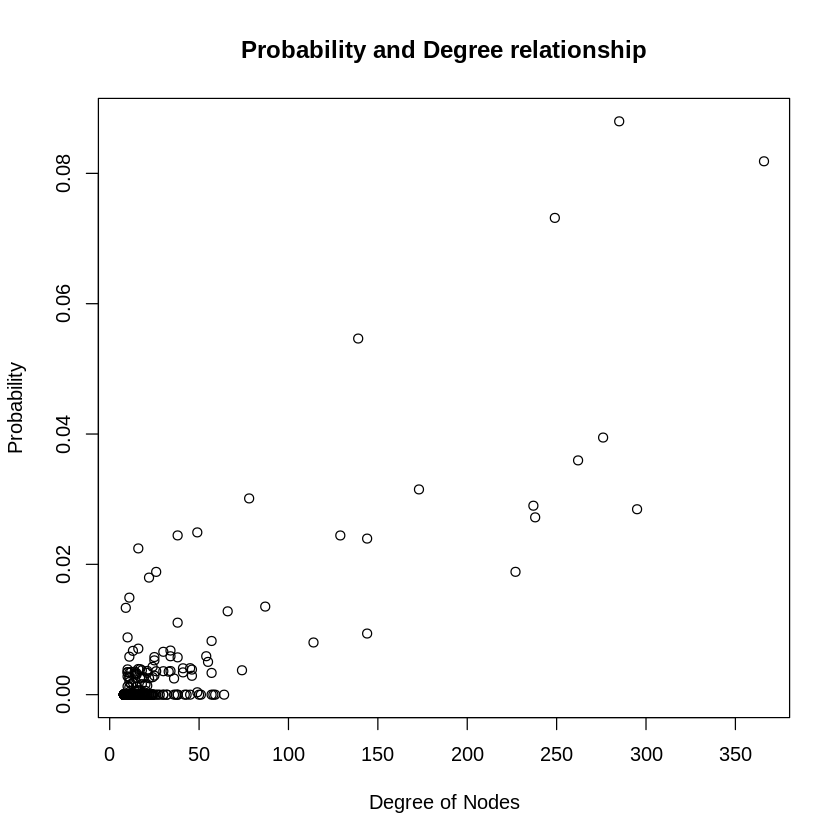

In [ ]:
degree3a = degree(graph3a, mode = "all")
probability_3a = all_fre/sum(all_fre)
plot(probability_3a, main = "Probability", xlab = "Nodes", ylab = "Probability" )
plot(degree3a, probability_3a, main = "Probability and Degree relationship", xlab = "Degree of Nodes", ylab = "Probability" )

[1] "Correlation between Degree of nodes and Probability 0.853673610654073"


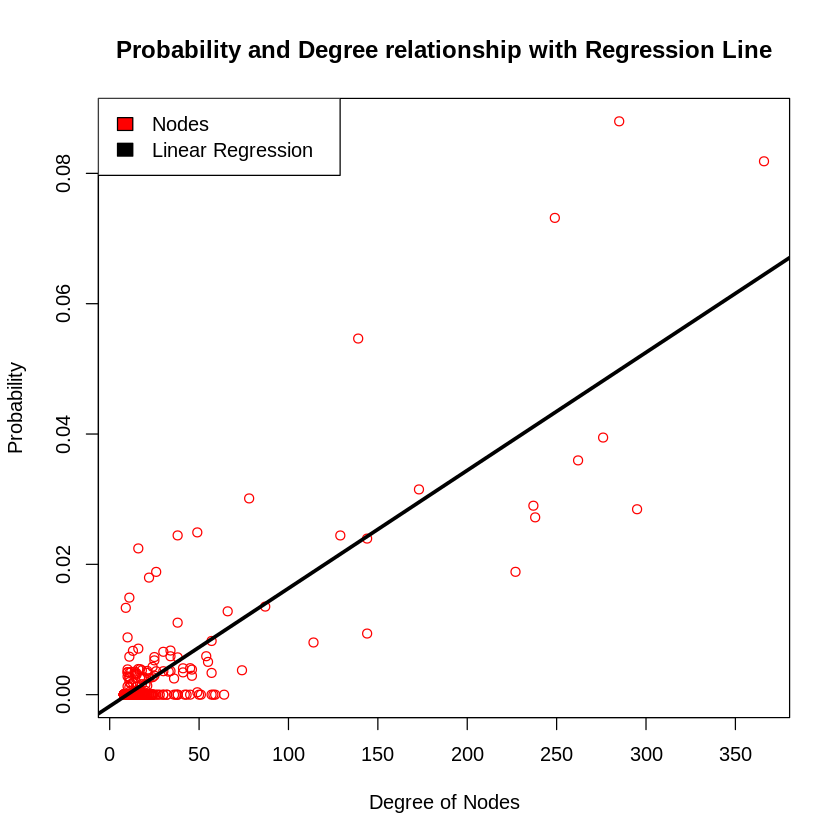

In [ ]:
# Add a regression line to see relationship
plot(degree3a, probability_3a, main = "Probability and Degree relationship with Regression Line", xlab = "Degree of Nodes", ylab = "Probability", col = 'red' )
regression = lm(probability_3a ~ degree3a)
abline(regression, lwd = 3)
legend('topleft', legend = c("Nodes","Linear Regression"),fill = c("red","black"))
print(paste("Correlation between Degree of nodes and Probability", cor(degree3a, probability_3a)))

In [ ]:
print(regression)


Call:
lm(formula = probability_3a ~ degree3a)

Coefficients:
(Intercept)     degree3a  
  -0.001777     0.000181  



### 3b

In [ ]:
# with teleportation
random_walk_telep = function (g, num_steps, start_node, transition_matrix = NULL, alpha, pr = rep(1/vcount(g), vcount(g))){
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    for(i in 1:num_steps){
        #fprintf('Step %d: %d\n', i, v)  # COMMENT THIS
        PMF = transition_matrix[v, ]
        random = sample(1:100,1)
        if (random < alpha*100){
          v = sample(1:vcount(g), 1, prob = pr)
        }
        else{
          v = sample(1:vcount(g), 1, prob = PMF) 
        }       
    }
    
    return(v)
}

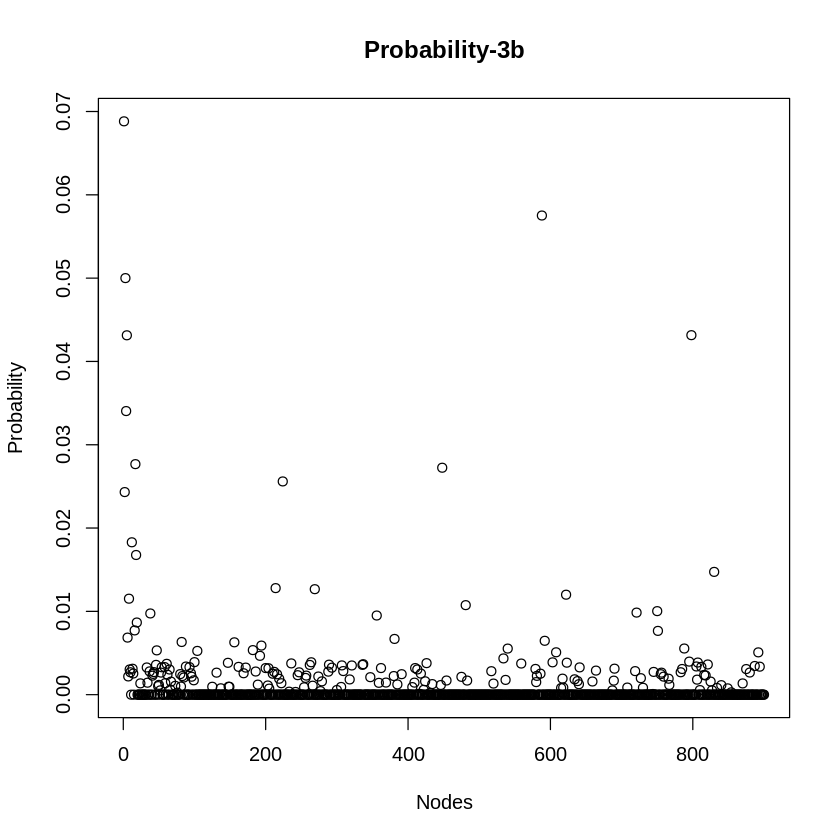

In [ ]:
frequency = rep(0, vcount(graph3a))
all_fre = rep(0, vcount(graph3a))
for(i in 1:500){
  start_node = sample(1:vcount(graph3a), 1)
  rw_nodes = random_walk_telep(graph3a , num_steps = 900, start_node, transition_matrix = create_transition_matrix(graph3a), alpha = 0.2)
  frequency[rw_nodes] = frequency[rw_nodes] + 1
  all_fre = all_fre + frequency
}
degree3b = degree(graph3a, mode = "all")
probability_3b = all_fre/sum(all_fre)
plot(probability_3b, main = "Probability-3b", xlab = "Nodes", ylab = "Probability" )

[1] "Correlation between Degree of nodes and Probability 0.883063805949925"


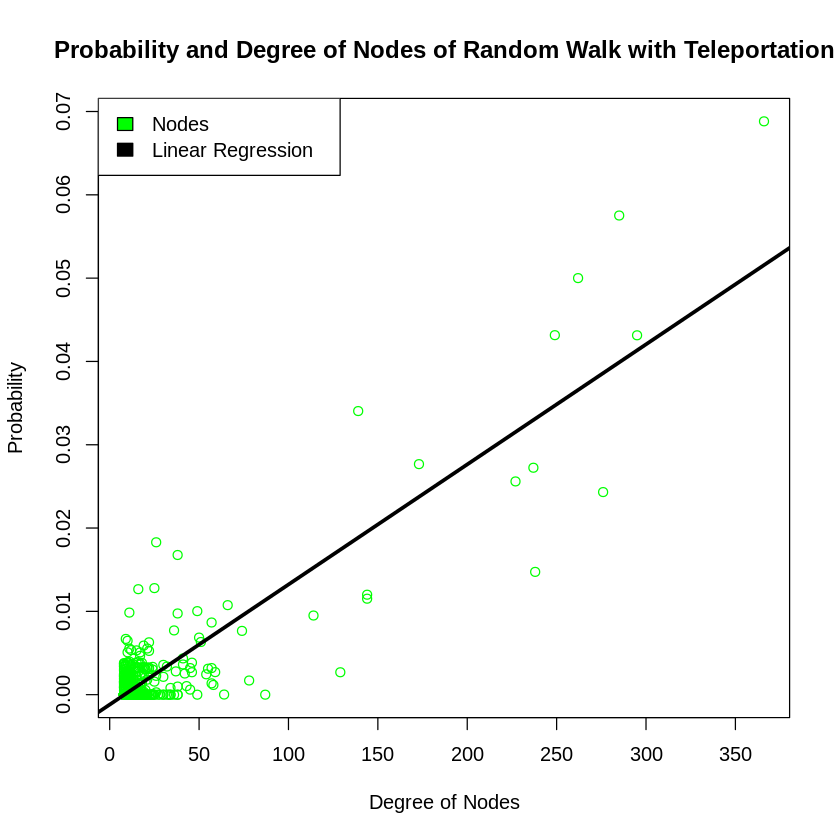

In [ ]:
# Add a regression line to see relationship
plot(degree3b, probability_3b, main = "Probability and Degree of Nodes of Random Walk with Teleportation", xlab = "Degree of Nodes", ylab = "Probability", col = 'green' )
regression = lm(probability_3b ~ degree3b)
abline(regression, lwd = 3)
legend('topleft', legend = c("Nodes","Linear Regression"),fill = c("green","black"))
print(paste("Correlation between Degree of nodes and Probability", cor(degree3b, probability_3b)))

In [ ]:
print(regression)


Call:
lm(formula = probability_3b ~ degree3b)

Coefficients:
(Intercept)     degree3b  
 -0.0011888    0.0001441  



### 4. Personalized PageRank

### 4a

In [ ]:
random_walk_4a = function (g, num_steps, start_node, transition_matrix = NULL, alpha, pr){
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    for(i in 1:num_steps){
        #fprintf('Step %d: %d\n', i, v)  # COMMENT THIS
        PMF = transition_matrix[v, ]
        random = sample(0:1,1)
        if (random < alpha){
          v = sample(1:vcount(g), 1, prob = pr)
        }
        else{
          v = sample(1:vcount(g), 1, prob = PMF) 
        }       
    }
    
    return(v)
}

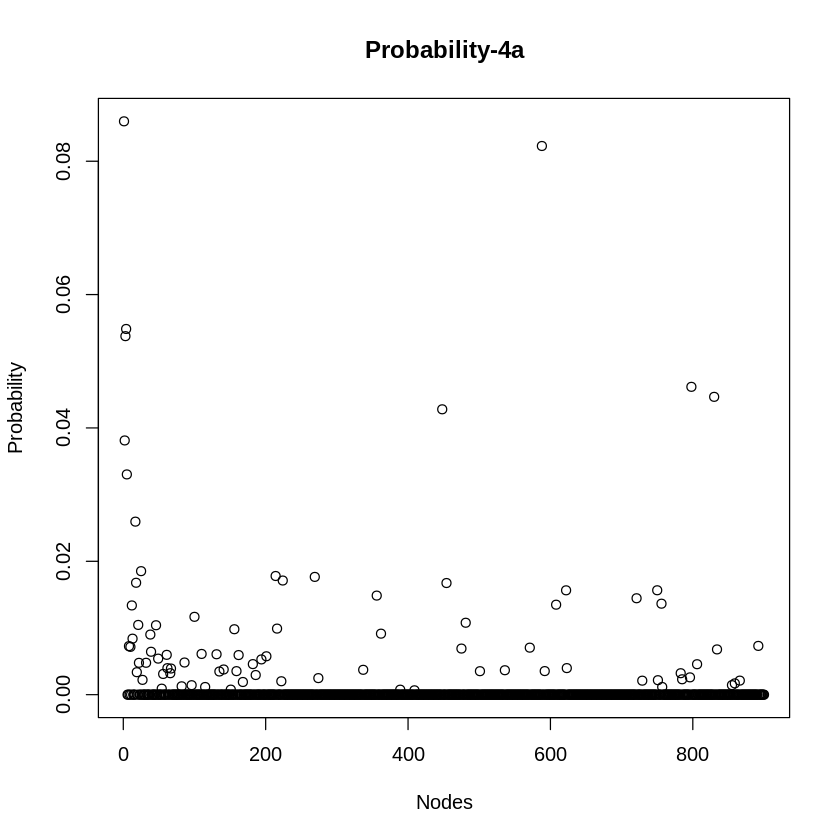

In [ ]:
frequency = rep(0, vcount(graph3a))
all_fre = rep(0, vcount(graph3a))
for(i in 1:500){
  start_node = sample(1:vcount(graph3a), 1)
  rw_nodes = random_walk_4a(graph3a, num_steps = 900, start_node, transition_matrix = create_transition_matrix(graph3a), alpha = 0.2, pr = probability_3a)
  frequency[rw_nodes] = frequency[rw_nodes] + 1
  all_fre = all_fre + frequency
}
degree4a = degree(graph3a, mode = "all")
probability_4a = all_fre/sum(all_fre)
plot(probability_4a, main = "Probability-4a", xlab = "Nodes", ylab = "Probability" )

[1] "Correlation between Degree of nodes and Probability 0.879870878809355"


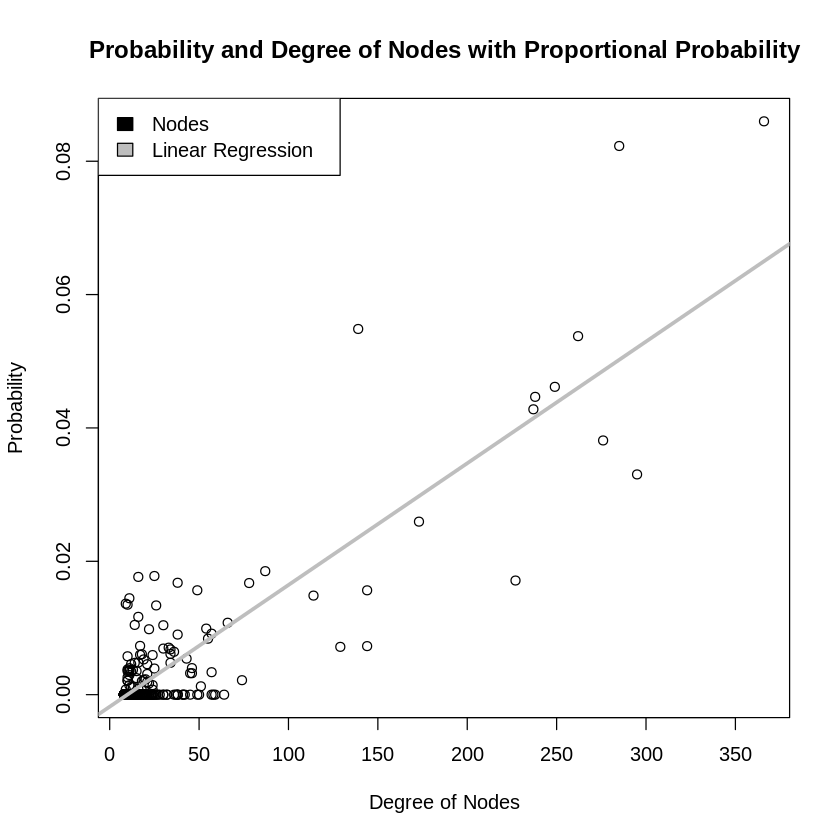

In [ ]:
plot(degree4a, probability_4a, main = "Probability and Degree of Nodes with Proportional Probability", xlab = "Degree of Nodes", ylab = "Probability", col = 'black' )
regression = lm(probability_4a ~ degree4a)
abline(regression, lwd = 3, col = 'grey')
legend('topleft', legend = c("Nodes","Linear Regression"),fill = c("black","grey"))
print(paste("Correlation between Degree of nodes and Probability", cor(degree4a, probability_4a)))

In [ ]:
print(regression)


Call:
lm(formula = probability_4a ~ degree4a)

Coefficients:
(Intercept)     degree4a  
 -0.0018011    0.0001825  



### 4b

In [ ]:
# Medians
order_value = order(page_rank(graph3a, directed = TRUE)$vector)
median1 = order_value[900/2]
median2 = order_value[900/2 + 1]

medians = c(median1,median2)
medians

[1] 671 817

In [ ]:
random_walk_medians = function (g, num_steps, start_node, transition_matrix = NULL, alpha){
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    for(i in 1:num_steps){
        #fprintf('Step %d: %d\n', i, v)  # COMMENT THIS
        PMF = transition_matrix[v, ]
        random = sample(1:100,1)
        if (random < alpha*100){
          prob_medians = rep(0, 900)
          prob_medians[medians] = 0.5
          v = sample(1:vcount(g), 1, prob = prob_medians)
        }
        else{
          v = sample(1:vcount(g), 1, prob = PMF) 
        }       
    }
    
    return(v)
}

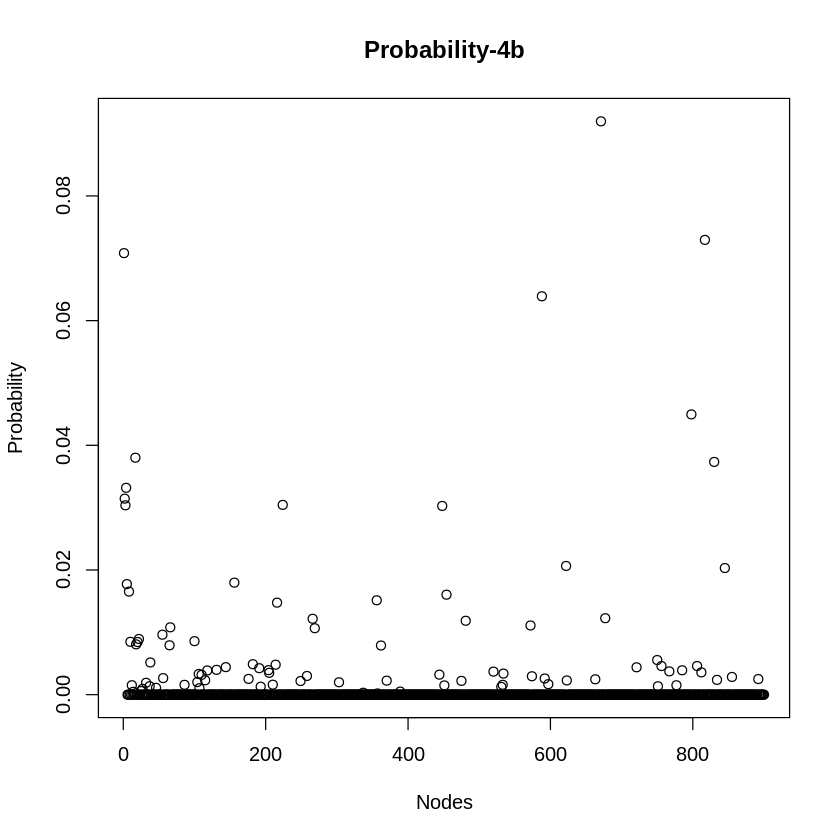

In [ ]:
frequency = rep(0, vcount(graph3a))
all_fre = rep(0, vcount(graph3a))
for(i in 1:500){
  start_node = sample(1:vcount(graph3a), 1)
  rw_nodes = random_walk_medians(graph3a, num_steps = 900, start_node, transition_matrix = create_transition_matrix(graph3a), alpha = 0.2)
  frequency[rw_nodes] = frequency[rw_nodes] + 1
  all_fre = all_fre + frequency
}
degree4b = degree(graph3a, mode = "all")
probability_4b = all_fre/sum(all_fre)
plot(probability_4b, main = "Probability-4b", xlab = "Nodes", ylab = "Probability" )

[1] "Correlation between Degree of nodes and Probability 0.690839514009922"


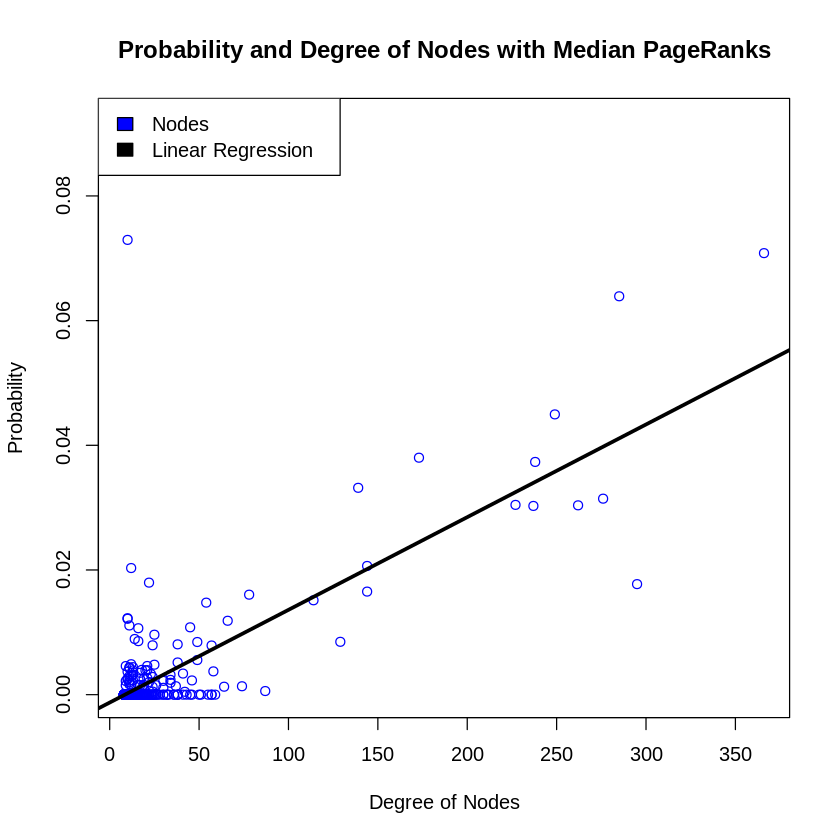

In [ ]:
plot(degree4b, probability_4b, main = "Probability and Degree of Nodes with Median PageRanks", xlab = "Degree of Nodes", ylab = "Probability", col = 'blue' )
regression = lm(probability_4b ~ degree4b)
abline(regression, lwd = 3, col = 'black')
legend('topleft', legend = c("Nodes","Linear Regression"),fill = c("blue","black"))
print(paste("Correlation between Degree of nodes and Probability", cor(degree4b, probability_4b)))

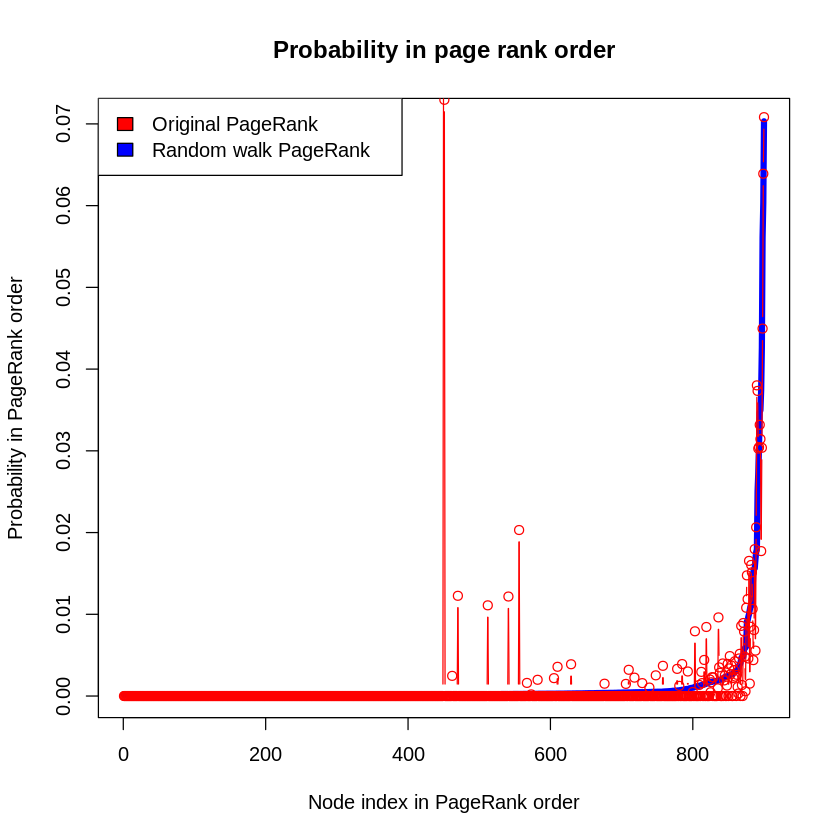

In [ ]:
plot(sort(page_rank(graph3a, directed = TRUE)$vector), main="Probability in page rank order",col="blue",type='l',lwd=5, xlab='Node index in PageRank order', ylab='Probability in PageRank order')
lines(probability_4b[order_value], col="red", type='b')
legend("topleft", legend = c("Original PageRank", "Random walk PageRank"), fill = c("red", "blue"))

In [ ]:
print(regression)


Call:
lm(formula = probability_4b ~ degree4b)

Coefficients:
(Intercept)     degree4b  
 -0.0012614    0.0001487  



### 4c

In [ ]:
random_walk_4c = function (g, num_steps, start_node, transition_matrix = NULL, alpha, beta){
    if(is.null(transition_matrix))
        transition_matrix = create_transition_matrix(g)
        
    v = start_node
    for(i in 1:num_steps){
        #fprintf('Step %d: %d\n', i, v)  # COMMENT THIS
        PMF = transition_matrix[v, ]
        random = sample(1:100,1)
        if (random < alpha*100){
          prob_medians = probability_3a * (1 - beta) / 1000
          prob_medians[medians] = prob_medians[medians] + beta *0.5
          v = sample(1:vcount(g), 1, prob = prob_medians)
        }
        else{
          v = sample(1:vcount(g), 1, prob = PMF) 
        }       
    }
    
    return(v)
}

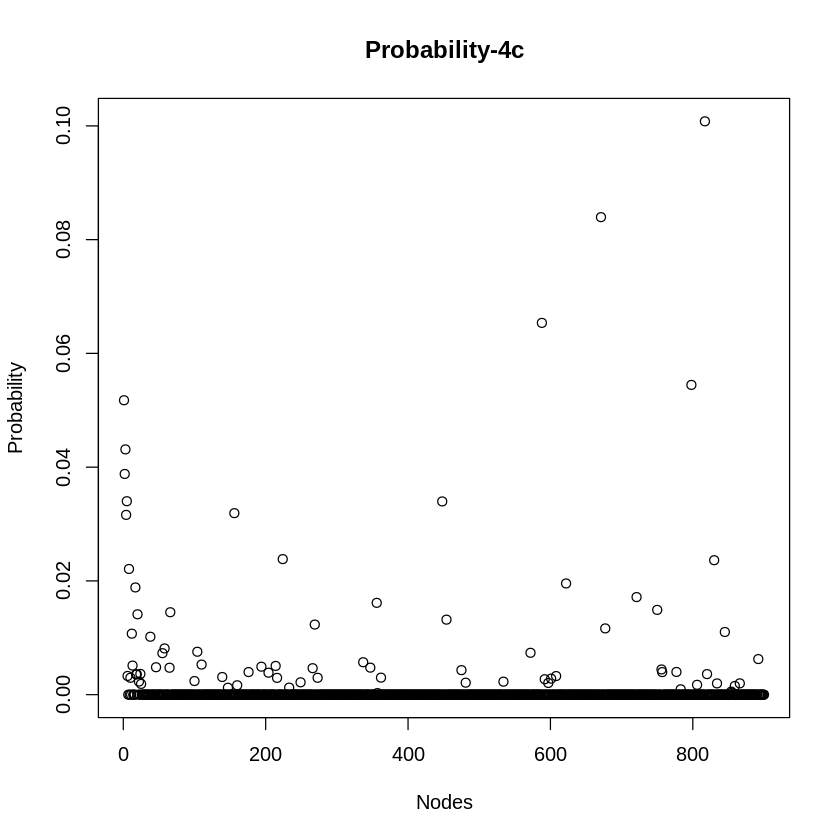

In [ ]:
frequency = rep(0, vcount(graph3a))
all_fre = rep(0, vcount(graph3a))
for(i in 1:500){
  start_node = sample(1:vcount(graph3a), 1)
  rw_nodes = random_walk_4c(graph3a, num_steps = 900, start_node, transition_matrix = create_transition_matrix(graph3a), alpha = 0.2, beta = 0.8)
  frequency[rw_nodes] = frequency[rw_nodes] + 1
  all_fre = all_fre + frequency
}
degree4c = degree(graph3a, mode = "all")
probability_4c = all_fre/sum(all_fre)
plot(probability_4c, main = "Probability-4c", xlab = "Nodes", ylab = "Probability" )

[1] "Correlation between Degree of nodes and Probability 0.655540684988428"


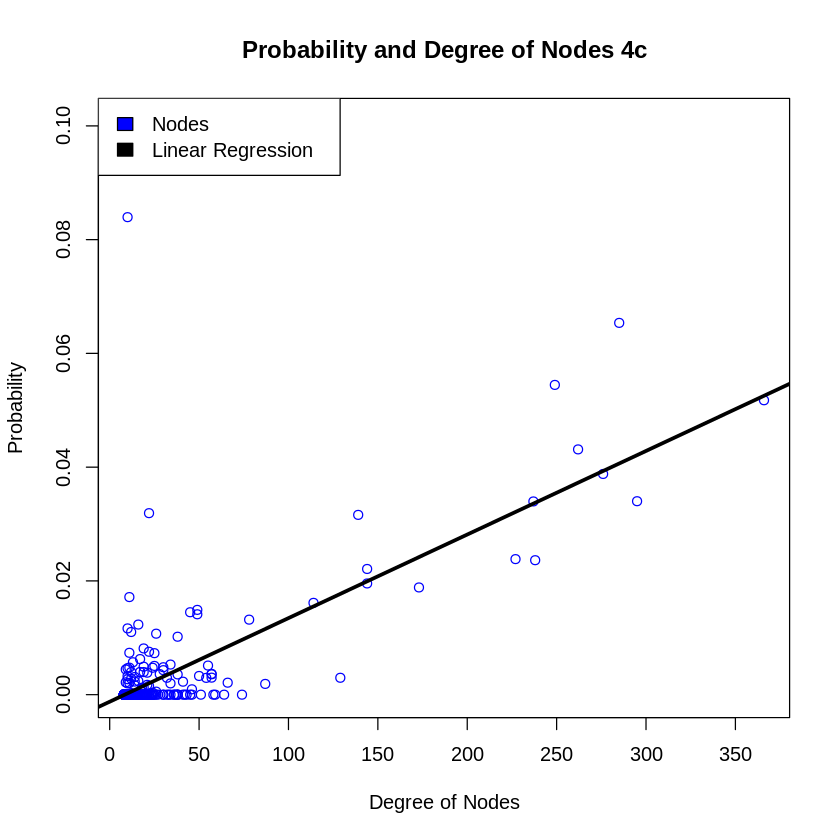

In [ ]:
plot(degree4c, probability_4c, main = "Probability and Degree of Nodes 4c", xlab = "Degree of Nodes", ylab = "Probability", col = 'blue' )
regression = lm(probability_4c ~ degree4b)
abline(regression, lwd = 3, col = 'black')
legend('topleft', legend = c("Nodes","Linear Regression"),fill = c("blue","black"))
print(paste("Correlation between Degree of nodes and Probability", cor(degree4c, probability_4c)))

In [ ]:
print(regression)


Call:
lm(formula = probability_4c ~ degree4b)

Coefficients:
(Intercept)     degree4b  
  -0.001234     0.000147  

